# **Problem Statement**


---

#### **Business Context**  
Understanding customer personality and behavior is pivotal for businesses to enhance customer satisfaction and increase revenue. Segmentation based on a customer's personality, demographics, and purchasing behavior allows companies to create tailored marketing campaigns, improve customer retention, and optimize product offerings.  

A leading retail company with a rapidly growing customer base seeks to gain deeper insights into their customers' profiles. The company recognizes that understanding customer personalities, lifestyles, and purchasing habits can unlock significant opportunities for personalizing marketing strategies and creating loyalty programs. These insights can help address critical business challenges, such as improving the effectiveness of marketing campaigns, identifying high-value customer groups, and fostering long-term relationships with customers.  

With the competition intensifying in the retail space, moving away from generic strategies to more targeted and personalized approaches is essential for sustaining a competitive edge.  

---

#### **Objective**  
In an effort to optimize marketing efficiency and enhance customer experience, the company has embarked on a mission to identify distinct customer segments. By understanding the characteristics, preferences, and behaviors of each group, the company aims to:  
1. Develop personalized marketing campaigns to increase conversion rates.  
2. Create effective retention strategies for high-value customers.  
3. Optimize resource allocation, such as inventory management, pricing strategies, and store layouts.  

As a data scientist tasked with this project, your responsibility is to analyze the given customer data, apply machine learning techniques to segment the customer base, and provide actionable insights into the characteristics of each segment.  

---

#### **Data Dictionary**  
The dataset includes historical data on customer demographics, personality traits, and purchasing behaviors. Key attributes are:  

1. **Customer Information**  
   - **ID:** Unique identifier for each customer.  
   - **Year_Birth:** Customer's year of birth.  
   - **Education:** Education level of the customer.  
   - **Marital_Status:** Marital status of the customer.  
   - **Income:** Yearly household income (in dollars).  
   - **Kidhome:** Number of children in the household.  
   - **Teenhome:** Number of teenagers in the household.  
   - **Dt_Customer:** Date when the customer enrolled with the company.  
   - **Recency:** Number of days since the customer’s last purchase.  
   - **Complain:** Whether the customer complained in the last 2 years (1 for yes, 0 for no).  

2. **Spending Information (Last 2 Years)**  
   - **MntWines:** Amount spent on wine.  
   - **MntFruits:** Amount spent on fruits.  
   - **MntMeatProducts:** Amount spent on meat.  
   - **MntFishProducts:** Amount spent on fish.  
   - **MntSweetProducts:** Amount spent on sweets.  
   - **MntGoldProds:** Amount spent on gold products.  

3. **Purchase and Campaign Interaction**  
   - **NumDealsPurchases:** Number of purchases made using a discount.  
   - **AcceptedCmp1:** Response to the 1st campaign (1 for yes, 0 for no).  
   - **AcceptedCmp2:** Response to the 2nd campaign (1 for yes, 0 for no).  
   - **AcceptedCmp3:** Response to the 3rd campaign (1 for yes, 0 for no).  
   - **AcceptedCmp4:** Response to the 4th campaign (1 for yes, 0 for no).  
   - **AcceptedCmp5:** Response to the 5th campaign (1 for yes, 0 for no).  
   - **Response:** Response to the last campaign (1 for yes, 0 for no).  

4. **Shopping Behavior**  
   - **NumWebPurchases:** Number of purchases made through the company’s website.  
   - **NumCatalogPurchases:** Number of purchases made using catalogs.  
   - **NumStorePurchases:** Number of purchases made directly in stores.  
   - **NumWebVisitsMonth:** Number of visits to the company’s website in the last month.  

# **Let's start coding!**

## **Importing necessary libraries**

In [50]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to suppress warnings
import warnings

warnings.filterwarnings("ignore")

## **Loading the data**

In [51]:
# uncomment and run the following line if using Google Colab
# from google.colab import drive
# drive.mount('/content/drive')

In [52]:
# loading data into a pandas dataframe
data = pd.read_csv("Customer_Personality_Segmentation.csv", sep="\t")

### **Creating a Working Copy of the Dataset**
It's a really good habit to create a copy of our original dataset right at the start of our analysis. This practice helps to **preserve the raw, untouched data** as a safeguard. By working on a copy, we're free to perform **data cleaning, transformations, and feature engineering** without worrying about accidentally altering the initial dataset. This approach is crucial for **reproducibility**, allowing us to easily revert to the original data, compare results, or correct any mistakes without having to reload the entire file.

In [53]:
# Make a copy of the original DataFrame to work with
df = data.copy()

## **Data Overview**

Before we jump into cleaning or modeling, it's super important to get a comprehensive first look at our raw data. This section combines several common initial checks to quickly understand the DataFrame's structure, identify potential issues like missing values or incorrect data types, and get some basic statistics. It's like taking a quick inventory of our data.

### **Data Structure and Types**
Let's start by examining the **data types** and **non-null counts** for each column. This step is crucial because it helps us quickly spot potential problems like **missing values** or columns that are not in the expected data format (e.g., dates as text), which we'll need to fix later.

To do this, we'll use `df.info()`:

In [54]:
# Display a summary of the DataFrame, including data types and non-null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

### **Unique Values Count**
Next, we'll check the **number of unique values** in each column. This helps us understand the **variety** within each feature, distinguishing between truly continuous numerical data, categorical data with a limited number of categories, and potentially identifying unique identifiers or columns that are constant (and therefore not useful for analysis).

Let's use `df.nunique()` to get these counts:

In [55]:
# Check the number of unique values for each column to understand data variety
df.nunique()

,0
ID,2240
Year_Birth,59
Education,5
Marital_Status,8
Income,1974
Kidhome,3
Teenhome,3
Dt_Customer,663
Recency,100
MntWines,776


#### **Observations on Data Structure and Unique Values**

The dataset comprises **2240 entries** and **29 columns**, offering a comprehensive view of customer data.

##### **Key Data Characteristics and Issues Identified:**

* **Missing Values**: The `Income` column has **24 missing values** (out of 2240). These will require imputation or removal during data cleaning.

* **Incorrect Data Type**: The `Dt_Customer` column is currently an `object` type (string) but represents dates. It needs to be converted to a proper **datetime format** for accurate time-based analysis, such as calculating customer tenure.

* **Unique Identifiers**: The `ID` column has **2240 unique values**, confirming its role as a unique identifier for each customer.

* **Categorical Features**: `Education` (5 unique values) and `Marital_Status` (8 unique values) are confirmed as categorical features, requiring appropriate encoding (e.g., one-hot encoding) for modeling.

* **Binary Flags**: `AcceptedCmp1` through `AcceptedCmp5`, `Response`, and `Complain` are binary indicators, each having 2 unique values (0 or 1).

* **Low Cardinality Numerical/Ordinal Features**: `Kidhome` and `Teenhome` have only 3 unique numerical values each, suggesting they could be treated as ordinal or categorical variables rather than continuous ones.

* **Continuous/Count Features**:
    * `Year_Birth` (59 unique values) is a numerical feature suitable for deriving customer age.
    * `Income` (1974 unique values) is a continuous numerical feature, despite the missing values.
    * `Dt_Customer` (663 unique values) further supports the need for datetime conversion, as it shows various customer enrollment dates.
    * `Recency` (100 unique values) is a continuous numerical feature crucial for understanding customer engagement.
    * The `Mnt` (amount spent on various products) and `Num` (number of purchases/visits) columns are all continuous numerical or count-based features, reflecting diverse customer behaviors.

* **Constant Columns for Removal**: `Z_CostContact` and `Z_Revenue` each have only 1 unique value, indicating they provide no discriminatory information for customer segmentation. These columns should be removed from the dataset during the cleaning phase.

In summary, the initial inspection reveals a relatively clean dataset with clear categorical and numerical features, but critical steps for data cleaning will involve handling missing `Income` values, converting `Dt_Customer` to datetime, and removing the constant `Z_CostContact` and `Z_Revenue` columns.

### **First and Last Rows Inspection**
Now, let's take a quick peek at the actual data by inspecting the **first five rows** using `df.head()` and the **last five rows** using `df.tail()`. This visual check is invaluable for getting a feel for the data's structure, what kind of information is in each column, and the general format of the entries. It's an initial "sanity check" to spot any obvious inconsistencies or unexpected values that might not be immediately apparent from just looking at data types or unique counts.

In [56]:
# Display the first 5 rows of the DataFrame
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [57]:
# Display the last 5 rows of the DataFrame
df.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0
2239,9405,1954,PhD,Married,52869.0,1,1,15-10-2012,40,84,3,61,2,1,21,3,3,1,4,7,0,0,0,0,0,0,3,11,1


#### **Observations from First and Last Rows:**
From visually inspecting the first and last few rows, we can confirm several aspects of our data:

* **Overall Structure:** The data is indeed organized into rows (for individual customers) and columns (for attributes), with clear headers.

* **Data Types Confirmation:**

 * `ID`, `Year_Birth`, `Kidhome`, `Teenhome`, `Recency`, and all `Mnt_` (amount spent) and `Num` (number of purchases/visits) columns, along with campaign acceptance flags (`AcceptedCmp_`, `Response`, `Complain`), `Z_CostContact`, and `Z_Revenue`, consistently contain **numerical (integer) values**, as expected from `df.info()`.

 * `Income` contains **numerical (float) values**, with decimal places, confirming its `float64` type.

 * `Education`, `Marital_Status`, and `Dt_Customer` clearly contain **text (object) values**. `Education` and `Marital_Status` aappear to be consistent categorical strings (e.g., 'Graduation', 'Single'). `Dt_Customer` is consistently in 'DD-MM-YYYY' format, which is good for planning future date conversions.

* **Missing Value Visual Check:** Although `df.info()` already highlighted missing values in `Income`, this visual check doesn't immediately show `NaN` values, as they don't happen to fall within these specific sample rows.

* **Consistency and Format:** Numerical columns generally show sensible values. Campaign response columns (`AcceptedCmpX`, `Response`, `Complain`) consistently show `0` or `1`, confirming their binary nature.

* **Constant Columns Confirmed:** Both `Z_CostContac`t and `Z_Revenue` consistently show the values `3` and `11` respectively across all displayed rows (first 5 and last 5). This visual confirmation strongly **reinforces our earlier observation** from `df.nunique()` that these columns are **constant and thus irrelevant** for customer segmentation. They should be removed.

* **No immediate obvious errors:** Beyond the missing `Income` values (which were already identified from `df.info()`), the sample rows don't show any glaring data entry errors or unexpected formats at first glance. We'll rely on descriptive statistics next to uncover more subtle issues like outliers.

### **Checking for Missing Values**
Missing data, often represented as `NaN` (Not a Number) or null, is a common issue in real-world datasets. These gaps in our data can significantly impact our analysis and the performance of machine learning models. Identifying and understanding where and how many missing values exist is a critical first step in the data cleaning process. This allows us to decide on appropriate strategies for handling them, such as imputation, deletion, or other methods, to ensure the integrity and reliability of our subsequent analysis.

Let's calculate and display the missing values:

In [58]:
# Store initial missing value counts for comparison
before_missing_values = df.isnull().sum()

before_missing_percentage = before_missing_values/len(df) * 100

# Create a DataFrame to display missing values
missing_df = pd.DataFrame({'Missing Values': before_missing_values, 'Percentage': before_missing_percentage})

# Display columns with missing values, sorted by percentage
print("Missing values in each column:")
missing_df[missing_df['Missing Values'] > 0].sort_values(by='Percentage', ascending=False)

Missing values in each column:


,Missing Values,Percentage
Income,24,1.071429


#### **Observation on Missing Values:**

* A critical initial finding is the presence of **24 missing values in the `Income` column**, which represents approximately 1.07% of the dataset. All other features are complete.

* Addressing these missing values will be a priority during the data cleaning phase, as 'Income' is a vital demographic and financial attribute for segmentation. Given the small percentage, imputation or removal are viable options, which will be decided upon after further exploration.

### **Checking for Duplicate Entries**
A crucial step to ensure data quality is to identify and address any **duplicate entries**. Duplicates can mess up our analysis, inflate the dataset size, and lead to incorrect model training outcomes. This check simply aims to confirm if there are any identical customer records present in our dataset.

Let's count the number of duplicate rows:

In [59]:
# Count the number of perfectly duplicate rows in the DataFrame
print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of duplicate rows: 0


##### **Observation on Duplicate Entries:**

The output `Number of duplicate rows: 0` is excellent news! This indicates that our dataset contains **no exact duplicate rows**. This is a positive finding because it means each customer record is unique, which helps ensure the integrity of our analyses and prevents potential biases in any models we build. This simplifies our pre-processing pipeline since we don't need to worry about removing redundant entries.

### **Descriptive Statistics Summary**
This section provides a **quantitative summary** of our dataset's numerical features. We'll look at measures like the central tendency (mean, median), dispersion (standard deviation, min/max), and the shape of the distribution (quartiles). This helps us quickly grasp typical values, how spread out the data is, and spot potential skewness or outliers that might need attention.

Let's generate these descriptive statistics:


In [60]:
# Generate descriptive statistics for all numerical columns in the DataFrame
# Use describe_before_clean in case of future comparison or to track changes after cleaning
describe_before_clean = df.describe()
describe_before_clean

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


#### **Initial Data Insights**

This initial statistical summary offers essential insights into our dataset's numerical features, including their distribution, central tendency, and potential issues.

* **Missing Values:** A critical initial finding is the presence of **24 missing values in the `Income` column**, which represents approximately 1% of the dataset. All other features are complete. Addressing these missing values will be a priority during the data cleaning phase, as 'Income' is a vital demographic and financial attribute for segmentation.

**1. Key Demographic & Core Financial Insights:**

* `ID`: As observed earlier, this is a unique identifier, and its statistics aren't particularly insightful beyond confirming uniqueness.
* `Year_Birth`: The birth years range from **1893** to 1996. The 'Year_Birth' column exhibits a significant outlier with a minimum value of 1893, implying an age of 121 years. This is highly improbable and likely a data entry error. This extreme value in 'Age' will require **robust outlier treatment** to prevent skewing age-related analyses and subsequent segmentation results. The mean year of birth is around 1968.
* `Income`:
    * The average income is around **\$52,247**, with a standard deviation of about \$25,173.
    * The `Income` distribution is **highly right-skewed**, with a maximum value of \$666,666 significantly distant from the 75th percentile (\$68,522). This, coupled with a minimum of $1,730, indicates the presence of **extreme outliers** on both ends of the spectrum. The peculiar value of $666,666 specifically suggests it might be a placeholder for an unusually high income or a data entry anomaly, necessitating careful outlier handling to ensure accurate representation of customer income levels.
* `Kidhome` & `Teenhome`: These are discrete counts representing children/teenagers at home, with reasonable ranges (0-2). Their means (around 0.44 and 0.50) suggest customers typically have less than one child or teenager on average. This aligns with our earlier `nunique()` observation that these have few unique values, indicating that having 0 or 1 child/teenager is most common, with very few households having 2.
* `Recency`: Ranges from 0 to 99 days. The average `Recency` is about 49 days, with a median also around 49 days (50th percentile). This feature seems fairly uniformly distributed across its range, and is important for understanding customer engagement.

**2. Product Spending Insights (`Mnt` Columns):**

* All `Mnt` (Amount Spent) columns have a `min` of **0.0**, indicating that many customers spent nothing on certain product categories.
* There is a wide variation in spending across different product categories. `MntWines` has the highest mean spending (around \$304), followed by `MntMeatProducts` (around \$167). Spending on `MntFruits`, `MntFishProducts`, and `MntSweetProducts` is generally lower, with means around \$26-38. `MntGoldProds` spending has a mean of around \$44.
* These columns generally exhibit **significant right-skewness** due to the concentration of values at zero (as seen by very low 25th percentiles of 1 to 16 for many categories) and the presence of high spenders (e.g., `MntMeatProducts` max at \$1725). This wide variability in spending patterns is valuable for customer segmentation, but the skewness and outliers will need consideration during analysis.

**3. Purchase Channel & Engagement Metrics (`Num` Columns):**

* The `Num` (Number of Purchases/Visits) columns (`NumDealsPurchases`, `NumWebPurchases`, `NumCatalogPurchases`, `NumStorePurchases`, `NumWebVisitsMonth`) are all count-based metrics.
* Customers make purchases through various channels, with `NumStorePurchases` having the highest mean (around 5.79), suggesting in-store purchases are the most frequent. `NumWebPurchases` has a mean of around 4.08, and `NumCatalogPurchases` has a mean of around 2.66.
* Similar to the spending columns, they are generally **right-skewed**, with `max` values indicating some customers engage much more frequently than the average (e.g., `NumWebVisitsMonth` up to 20 visits in a month, `NumCatalogPurchases` up to 28).

**4. Binary Campaign & Complaint Flags:**

* **`AcceptedCmp` (1-5) & `Response`**: These are **binary (0/1)** flags indicating campaign acceptance. Their very low `mean` values (e.g., `AcceptedCmp1` mean of 0.06, `Response` mean of 0.149) indicate that **only a small percentage of customers engaged positively** with these campaigns.
* **Complain:** Another **binary (0/1)** flag, with an extremely low `mean` (0.009), suggesting **very few complaints** were recorded.

**5. Constant Columns: `Z_CostContact` and `Z_Revenue`:**

* Columns `Z_CostContact` and `Z_Revenue` are identified as **invariant (constant)**, with standard deviations of 0.0. This indicates they hold a single unique value across all records (3.0 and 11.0 respectively). As they provide no discriminatory information for customer differentiation or predictive modeling, these columns will be **removed from the dataset** during the preprocessing phase.

**Overall Summary:**

In summary, our initial descriptive analysis highlights several critical data quality issues: **missing values in `Income`**, and **significant outliers in `Year_Birth` and `Income`**. We also observe **right-skewed distributions** across various spending and purchasing behavior features, indicating diverse customer engagement patterns. Furthermore, the **low response rates for marketing campaigns** are noteworthy, and two columns, `Z_CostContact` and `Z_Revenue`, are **constant and will be eliminated**. These findings will directly inform our subsequent data cleaning, transformation, and feature engineering strategies to prepare a robust dataset for effective customer segmentation.



### **Key Takeaways from Data Overview**

This initial comprehensive data overview has revealed several critical insights that will directly shape our subsequent data preparation and analysis:

* **Data Integrity Issues:** We've identified **24 missing values in the `Income` column** and a clear need to **convert `Dt_Customer` to a datetime format**.
* **Significant Outliers:** Extreme values in **`Year_Birth`** (suggesting impossible ages) and **`Income`** require careful outlier handling.
* **Constant Features for Removal:** `Z_CostContact` and `Z_Revenue` are invariant columns and will be **removed** as they offer no analytical value.
* **Diverse Customer Behaviors:** Numerical features related to spending (`Mnt_` columns) and purchasing channels (`Num_` columns) exhibit wide variations and **right-skewed distributions**, indicating diverse customer segments and the potential need for transformations.
* **Low Campaign Engagement:** Marketing campaign acceptance rates (`AcceptedCmp_`, `Response`) are generally low, which is a key observation for future marketing strategy analysis.

These findings confirm that while the dataset is relatively clean, addressing the identified data quality issues and understanding the distributions will be paramount to preparing a robust dataset for effective customer segmentation and modeling.

## **Data Preprocessing (Transformation & Cleaning)**
After our initial data overview, we've identified areas that require preprocessing before we can proceed with analysis and modeling. This phase involves both **transforming** existing data (such as creating new features) and **cleaning** it (by handling missing values, addressing potential outliers, and ensuring data consistency). The goal of this data preprocessing phase is to ensure the dataset is accurate, consistent, and in a suitable format for customer segmentation.

### **Converting `Dt_Customer` to Datetime**
To make sure we can do proper time-based analysis and create cool new features, we first need to convert the `Dt_Customer` column. Right now, it's just a regular text string (`object` type), but we want it to be a special **datetime object**. This transformation is super important for things like figuring out how long a customer has been with us (their tenure) or looking at enrollment trends over time.

It's worth noting that we **won't convert `Year_Birth` to a full datetime** object. `Year_Birth` is purely about the year a customer was born, and its main purpose for us is to calculate their `Age`. The year itself is enough for that, so a full datetime conversion would be extra work we don't need. We'll handle any weird birth years when we create the `Age` feature.

Let's convert `Dt_Customer` to datetime format:

In [61]:
# Convert the 'Dt_Customer' column from string to datetime format
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

# Display the first few entries of the converted column to verify
print("First 5 entries of 'Dt_Customer' after conversion:")
df['Dt_Customer'].head()

First 5 entries of 'Dt_Customer' after conversion:


,Dt_Customer
0,2012-09-04
1,2014-03-08
2,2013-08-21
3,2014-02-10
4,2014-01-19


##### **Observation on Dt_Customer Datetime Conversion:**

The `Dt_Customer` column has been **successfully converted from its original string format to a proper datetime object**. This is confirmed by the output showing the new `dtype: datetime64[ns]`. This fundamental change now allows us to perform accurate time-based calculations and derive new features, which will be very useful for understanding customer behavior.

### **Feature Engineering**
Based on our understanding of the data and the problem statement, we will now create new features that can provide more meaningful insights for customer segmentation. This involves transforming existing columns and combining related information to better represent customer characteristics and behaviors. The following features will be engineered:

*   Derive `Age` from `Year_Birth`.
*   Calculate `Customer_Tenure_Days`, `Enrollment_Year`, and `Enrollment_Month` from `Dt_Customer`.
*   Create `TotalSpending` from the sum of all `Mnt_` columns.
*   Consolidate `TotalAcceptedCmp` from the sum of all `AcceptedCmp` columns and `Response`.
*   Consolidate `ChildrenAtHome` from the sum of `Kidhome` and `Teenhome`.

#### **Customer Tenure and Enrollment Trends**
Understanding how long a customer has been with a company, which we call **Customer Tenure**, and when they joined (their **Enrollment Year/Month**) can give us fantastic insights. Loyal customers often behave differently, and looking at enrollment patterns can show us seasonal trends or how well past marketing campaigns worked. We'll get these insights directly from our `Dt_Customer` column.

Let's calculate these new time-based features:

In [62]:
# First, ensure 'Dt_Customer' is in datetime format.
# This line is a safety check; if it's already datetime, it just confirms it.
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

# Calculate 'Customer_Tenure_Days': Days between customer's enrollment and the latest enrollment date in the dataset.
# Using the latest date makes sure our tenure calculation is consistent and relative to our data's timeframe.
latest_enrollment_date = df['Dt_Customer'].max()
df['Customer_Tenure_Days'] = (latest_enrollment_date - df['Dt_Customer']).dt.days

# Extract 'Enrollment_Year' from the 'Dt_Customer'
df['Enrollment_Year'] = df['Dt_Customer'].dt.year

# Extract 'Enrollment_Month' from the 'Dt_Customer'
df['Enrollment_Month'] = df['Dt_Customer'].dt.month

# Display the head of the DataFrame to show our new columns
print(df[['Dt_Customer', 'Customer_Tenure_Days', 'Enrollment_Year', 'Enrollment_Month']].head())

  Dt_Customer  Customer_Tenure_Days  Enrollment_Year  Enrollment_Month
0  2012-09-04                   663             2012                 9
1  2014-03-08                   113             2014                 3
2  2013-08-21                   312             2013                 8
3  2014-02-10                   139             2014                 2
4  2014-01-19                   161             2014                 1


##### **Observation on Customer Tenure and Enrollment Trends Features:**
We've successfully created three new, insightful features: `Customer_Tenure_Days`, `Enrollment_Year`, and `Enrollment_Month`.

* `Customer_Tenure_Days`: This feature provides a direct measure of how long each customer has been active with the company, calculated in days relative to the latest enrollment date in our dataset. This is crucial for understanding customer loyalty and retention.

* `Enrollment_Year` and `Enrollment_Month`: These features extract the year and month a customer enrolled. They will be very useful for analyzing customer acquisition trends, helping us spot any seasonal patterns or specific periods when many customers joined.

These new time-based features significantly enrich our dataset, moving us closer to identifying distinct customer segments based on their loyalty and acquisition patterns.

#### **Deriving Age**
To get a better demographic understanding of our customers, we'll create a new `Age` feature. We'll calculate `Age` by subtracting `Year_Birth` from a consistent reference year. We're using the **maximum year from our `Dt_Customer` column (2014)** as our reference. This ensures our age calculations are consistent with the timeframe of our data and are reproducible, preventing age inflation if we were to use the current calendar year.

Let's calculate the `Age` column:

In [63]:
# Calculate the maximum year from Dt_Customer to use as a consistent reference point for age calculation
reference_year = df['Dt_Customer'].dt.year.max()

# Create the 'Age' column by subtracting Year_Birth from the reference year
df['Age'] = reference_year - df['Year_Birth']

# Display the first few rows with the new Age column and its statistical summary
print("DataFrame head with new 'Age' column:")
df.head()

DataFrame head with new 'Age' column:


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Customer_Tenure_Days,Enrollment_Year,Enrollment_Month,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,663,2012,9,57
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,113,2014,3,60
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,312,2013,8,49
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,139,2014,2,30
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,161,2014,1,33


In [64]:
# Display the statistical summary of the 'Age' column to check its distribution and identify potential outliers
df['Age'].describe()

,Age
count,2240.000000
mean,45.194196
std,11.984069
min,18.000000
25%,37.000000
50%,44.000000
75%,55.000000
max,121.000000


##### **Observation on Derived Age Feature:**
The new `Age` feature has been successfully created by subtracting the Year_Birth from our consistent **reference year of 2014**. This method ties our age calculations directly to the dataset's timeframe, making our insights relevant to the customer data provided.

The statistical summary of the Age column reveals:

* **Range:** We can see a very wide age range, from a minimum of **18 years to a maximum of 121 years.**

* **Central Tendency:** The **average age (mean) is about 45.2 years**, with half of our customers (`50th percentile`) being 44 years old or younger.

* **Distribution:** The standard deviation of around 12 years indicates a moderate spread in ages. Most customers (between the 25th and 75th percentiles) are between 37 and 55 years old.

The presence of a **maximum age of 121 years** immediately stands out. This confirms our earlier suspicion from `df.describe()` (before cleaning) that there's an **outlier in the `Year_Birth` data** (or consequently, in `Age`). We'll need to address this extreme value in our dedicated outlier treatment step to ensure it doesn't negatively impact our analysis.

#### **Creating a `TotalSpending` Metric**

Here, we'll create another useful feature: TotalSpending. This metric will be the **sum of all amounts a customer spent across all product categories** (like wines, fruits, meat, etc.). Aggregating these individual spending columns gives us a comprehensive view of each customer's overall value and purchasing behavior, which is really helpful for segmentation.

You might wonder why we'd keep the individual spending columns (e.g., `MntWines`, `MntMeatProducts`) after creating `TotalSpending`. The reason is **granularity**. While `TotalSpending` tells us the overall amount, the individual columns tell us *what specific products* customers are spending on. This product-level detail is crucial for understanding specific preferences, which can lead to much more insightful customer segments and highly targeted marketing strategies. We'd lose this valuable, actionable information if we dropped them.

Let's create the `TotalSpending` column:

In [65]:
# Create the 'TotalSpending' column by summing all individual spending categories
df['TotalSpending'] = df['MntWines'] + df['MntFruits'] + df['MntMeatProducts'] + \
                      df['MntFishProducts'] + df['MntSweetProducts'] + df['MntGoldProds']

# Print summary statistics for 'TotalSpending' to get an overview
print("Summary statistics for 'TotalSpending' column:")
print(df['TotalSpending'].describe())

Summary statistics for 'TotalSpending' column:
count    2240.000000
mean      605.798214
std       602.249288
min         5.000000
25%        68.750000
50%       396.000000
75%      1045.500000
max      2525.000000
Name: TotalSpending, dtype: float64


##### **Observation on TotalSpending:**

The summary statistics for `TotalSpending` reveal a clear pattern: a **highly right-skewed distribution**. This means that most customers have relatively lower total spending, while a smaller group of customers accounts for a very significant portion of the total expenditure.

* The **mean spending (\$605.80)** is notably higher than the **median spending (\$396.00)**, which is a strong indicator of this right-skewness and the influence of high-spending customers.
* There's a **wide range in customer spending**, from a minimum of \$5.00 to a maximum of \$2,525.00.
* The **standard deviation of \$602.25** is quite large relative to the mean, further highlighting the substantial variability in customer spending habits.
* The quartile values confirm this skewness: 75% of customers spend less than \$1,045.50, but the jump from the median to the 75th percentile is much larger than from the 25th percentile to the median. This confirms the presence of customers with **exceptionally high spending**, which we'll need to consider when handling outliers.

#### **Consolidating Campaign Acceptance**
In our dataset, we have several binary features (0 or 1) indicating whether a customer accepted specific marketing campaigns (`AcceptedCmp1` through `AcceptedCmp5`) and the last campaign (`Response`). While these individual flags provide granular information, their high sparsity (very few customers accepted each specific campaign) can pose challenges for downstream analysis, particularly clustering. Highly skewed features often add noise without significantly contributing to meaningful cluster separation.

To address this, we will consolidate these individual campaign acceptance flags into a single, more informative feature: `TotalAcceptedCmp`. This new feature will represent the **total number of campaigns a customer has accepted.** This approach offers several benefits:

* **Dimensionality Reduction:** Reduces the number of sparse columns.

* **Enhanced Information:** Creates a more nuanced measure of a customer's overall responsiveness to campaigns, moving beyond a simple binary "accepted/not accepted" for a single campaign.

* **Improved Model Performance:** A less sparse, more continuous feature can sometimes lead to better performance and interpretability in clustering and other machine learning models by providing a clearer signal of campaign engagement.

Let's consolidate the campaign acceptance columns:

In [66]:
# Define the list of campaign acceptance columns, including 'Response' if it indicates acceptance of the last campaign
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']

# Ensure all specified columns exist in the DataFrame before attempting to sum them
# Filter out any columns that might not be present to prevent errors
existing_campaign_columns = [col for col in campaign_columns if col in df.columns]

if not existing_campaign_columns:
    print("Warning: No campaign acceptance columns found in the DataFrame to combine.")
    print("Please ensure your DataFrame contains columns like 'AcceptedCmp1', 'Response', etc.")
else:
    # Create the 'TotalAcceptedCmp' feature by summing across the specified columns
    df['TotalAcceptedCmp'] = df[existing_campaign_columns].sum(axis=1)

    print(f"Successfully created 'TotalAcceptedCmp' by summing: {existing_campaign_columns}")
    print("\nDescriptive statistics for the new feature:")
    print(df['TotalAcceptedCmp'].describe())

    print("\nValue counts for the new feature:")
    print(df['TotalAcceptedCmp'].value_counts().sort_index())

    # Optional: You can now drop the individual campaign columns if you only plan to use 'TotalAcceptedCmp'
    # Uncomment the line below if you wish to remove the original individual campaign columns
    # df = df.drop(columns=existing_campaign_columns)
    # print(f"\nDropped individual campaign columns: {existing_campaign_columns}")

Successfully created 'TotalAcceptedCmp' by summing: ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']

Descriptive statistics for the new feature:
count    2240.000000
mean        0.446875
std         0.890543
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         5.000000
Name: TotalAcceptedCmp, dtype: float64

Value counts for the new feature:
TotalAcceptedCmp
0    1631
1     370
2     142
3      51
4      36
5      10
Name: count, dtype: int64


##### **Individual Campaign Acceptance Rates**
While the `TotalAcceptedCmp` feature gives us an overall measure of campaign responsiveness, analyzing the acceptance rate of each individual campaign (`AcceptedCmp1` through `AcceptedCmp5` and the final `Response`) can reveal insights into the effectiveness of specific campaigns and potential trends over time. This helps us understand which campaigns resonated most with customers. The following code calculates the percentage of customers who accepted each of these campaigns.

Let's calculate the individual campaign acceptance rates:

In [67]:
# Define the list of campaign acceptance columns
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response']

# Calculate the percentage of acceptance for each campaign
campaign_acceptance_percentages = (df[campaign_columns].sum() / len(df)) * 100

# Display the percentages
print("Percentage of customers who accepted each campaign:")
print(campaign_acceptance_percentages)

Percentage of customers who accepted each campaign:
AcceptedCmp1     6.428571
AcceptedCmp2     1.339286
AcceptedCmp3     7.276786
AcceptedCmp4     7.455357
AcceptedCmp5     7.276786
Response        14.910714
dtype: float64


##### **Observation: Total Accepted Campaigns & Individual Campaign Performance**

The descriptive statistics and value counts for the newly created `TotalAcceptedCmp` feature, combined with the analysis of individual campaign acceptance rates, provide a clear picture of customer engagement with marketing campaigns:

*   **Low Overall Acceptance:** The mean (0.45) and median (0) of `TotalAcceptedCmp` indicate that, on average, customers accept less than one campaign. This suggests a low overall positive response rate to the campaigns included in the dataset.
*   **Majority Did Not Accept Any Campaigns:** The value counts are particularly telling, showing that a significant majority of customers (**1631 out of 2240, or approximately 73%**) have a `TotalAcceptedCmp` value of 0, meaning they did not accept any of the listed campaigns.
*   **No Customers Accepted All Campaigns:** We also confirmed that **no customers accepted all six campaigns** (TotalAcceptedCmp = 6).
*   **Presence of Highly Engaged Customers:** While the majority didn't respond, the maximum value of 5 and the presence of customers who accepted 1, 2, 3, 4, or 5 campaigns demonstrate that a smaller, more engaged segment of the customer base is responsive to multiple campaigns.

**Individual Campaign Acceptance Rates:**

Looking at the percentage of customers who accepted each individual campaign:

*   **AcceptedCmp1:** 6.43%
*   **AcceptedCmp2:** 1.34%
*   **AcceptedCmp3:** 7.28%
*   **AcceptedCmp4:** 7.46%
*   **AcceptedCmp5:** 7.28%
*   **Response (Last Campaign):** 14.91%

These rates show variability across campaigns. While there isn't a consistent upward trend from Campaign 1 to 5, the **last campaign (`Response`) had the highest acceptance rate**, suggesting it was the most effective among the ones listed.

This feature highlights a distinct difference in customer behavior regarding campaign interaction and will be a useful dimension for identifying customer segments with varying levels of responsiveness to marketing efforts.

#### **Consolidating Children at Home**
Our dataset includes `Kidhome` and `Teenhome` columns, which represent the number of young children and teenagers living in the household, respectively. While these separate features are informative, combining them can create a more holistic and intuitive measure of family structure and the number of dependents in a customer's home. This new consolidated feature, let's call it `ChildrenAtHome`, will represent the **total number of children (both kids and teens) living with the customer.**

This consolidation offers several advantages:

* **Simplified Representation:** Provides a single, clear metric instead of two related ones, making analysis easier.

* **Enhanced Insights:** Allows for direct assessment of how the overall number of dependents might influence purchasing behavior, spending patterns, or other customer characteristics.

* **Reduced Dimensionality:** Decreases the number of features, which can be beneficial for certain modeling tasks and improve interpretability.

Let's consolidate the children-related columns:

In [68]:
# Define the columns to be combined
children_home_columns = ['Kidhome', 'Teenhome']

# Ensure both specified columns exist in the DataFrame
existing_children_home_columns = [col for col in children_home_columns if col in df.columns]

if len(existing_children_home_columns) < 2:
    print("Warning: One or both of 'Kidhome' and 'Teenhome' columns not found in the DataFrame.")
    print("Please ensure your DataFrame contains both columns before attempting to combine them.")
elif len(existing_children_home_columns) == 2:
    # Create the 'ChildrenAtHome' feature by summing across the specified columns
    df['ChildrenAtHome'] = df[existing_children_home_columns].sum(axis=1)

    print(f"Successfully created 'ChildrenAtHome' by summing: {existing_children_home_columns}")
    print("\nDescriptive statistics for the new feature:")
    print(df['ChildrenAtHome'].describe())

    print("\nValue counts for the new feature:")
    print(df['ChildrenAtHome'].value_counts().sort_index())

    # Optional: You can now drop the individual 'Kidhome' and 'Teenhome' columns if you only plan to use 'ChildrenAtHome'
    # Uncomment the line below if you wish to remove the original individual columns
    # df = df.drop(columns=existing_children_home_columns)
    # print(f"\nDropped individual columns: {existing_children_home_columns}")

Successfully created 'ChildrenAtHome' by summing: ['Kidhome', 'Teenhome']

Descriptive statistics for the new feature:
count    2240.000000
mean        0.950446
std         0.751803
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: ChildrenAtHome, dtype: float64

Value counts for the new feature:
ChildrenAtHome
0     638
1    1128
2     421
3      53
Name: count, dtype: int64


##### **Observation: Children at Home**

The descriptive statistics and value counts for the `ChildrenAtHome` feature, which combines `Kidhome` and `Teenhome`, provide a clear view of the number of dependents in customer households:

*   **Average Dependents:** The mean number of children at home is around **0.95**, suggesting that on average, customers have less than one dependent.
*   **Common Household Structures:** The value counts reveal the most common scenarios:
    *   **638 customers (approx. 28.5%)** have **0 children** at home.
    *   **1128 customers (approx. 50.4%)** have **1 child** at home.
    *   **421 customers (approx. 18.8%)** have **2 children** at home.
    *   **53 customers (approx. 2.4%)** have **3 children** at home.
*   **Distribution:** The majority of customers have 0 or 1 child at home, with fewer having 2 or 3. This distribution suggests that the presence and number of children are significant factors that could differentiate customer segments.

This feature effectively consolidates the information about children and teenagers, providing a single metric that is likely to be valuable for segmenting customers based on their family structure and the potential impact on their purchasing priorities and behaviors.

#### **Regrouping Low-Frequency Categories**
Based on our univariate analysis of categorical features, we identified several categories in 'Marital_Status' and 'Education' with very low frequencies. To create more robust categories for analysis and modeling, we will regroup these low-frequency categories.

*   In 'Marital\_Status', we will group 'Alone', 'Absurd', and 'YOLO' into the 'Single' category.
*   In 'Education', we will group '2n Cycle' with 'Basic'.

Let's perform the regrouping for 'Marital_Status' and 'Education':

In [69]:
# --- Marital_Status Regrouping ---
print("--- Marital_Status Regrouping ---")

# Store original counts
original_marital_counts = df['Marital_Status'].value_counts()

# Define the mapping for regrouping
marital_status_mapping = {
    'Alone': 'Single',
    'Absurd': 'Single',
    'YOLO': 'Single'
}

# Apply the regrouping
df['Marital_Status'] = df['Marital_Status'].replace(marital_status_mapping)

# Get new counts
new_marital_counts = df['Marital_Status'].value_counts()

# Create a comparison DataFrame
marital_comparison = pd.DataFrame({
    'Before Regrouping': original_marital_counts,
    'After Regrouping': new_marital_counts
}).fillna(0).astype(int) # Fill NaNs (for categories that disappear) and convert to int

# Verify the new distribution (optional, but recommended)
print(marital_comparison)


# --- Education Regrouping ---
print("\n--- Education Regrouping ---")

# Store original counts
original_education_counts = df['Education'].value_counts()

# Define the mapping for regrouping Education categories
education_mapping = {
    'Basic': 'Undergraduate',
    '2n Cycle': 'Undergraduate',
}

# Apply the regrouping
df['Education'] = df['Education'].replace(education_mapping)

# Get new counts
new_education_counts = df['Education'].value_counts()

# Create a comparison DataFrame
education_comparison = pd.DataFrame({
    'Before Regrouping': original_education_counts,
    'After Regrouping': new_education_counts
}).fillna(0).astype(int) # Fill NaNs and convert to int

print(education_comparison)


--- Marital_Status Regrouping ---
                Before Regrouping  After Regrouping
Marital_Status                                     
Absurd                          2                 0
Alone                           3                 0
Divorced                      232               232
Married                       864               864
Single                        480               487
Together                      580               580
Widow                          77                77
YOLO                            2                 0

--- Education Regrouping ---
               Before Regrouping  After Regrouping
Education                                         
2n Cycle                     203                 0
Basic                         54                 0
Graduation                  1127              1127
Master                       370               370
PhD                          486               486
Undergraduate                  0               257


##### **Observation on Categorical Regrouping:**

Based on the frequency analysis in the univariate EDA, we regrouped low-frequency categories in 'Marital_Status' and 'Education' to create a more robust set of categories for segmentation:

*   **Marital Status:** The categories 'Alone', 'Absurd', and 'YOLO', which had very low counts, were successfully grouped into the 'Single' category. This reduced the number of 'Marital\_Status' categories from 8 to 5, consolidating sparse categories into a more meaningful group.
*   **Education:** The low-frequency category '2n Cycle' was successfully grouped with 'Basic'. This reduced the number of 'Education' categories from 5 to 4.

By regrouping these categories, we have simplified the categorical features and addressed the issue of sparsity, which can improve the performance and stability of clustering algorithms and make the resulting segments more interpretable. The value counts after regrouping confirm the new distribution of customers across these consolidated categories.

### **Handling Missing Values**
Missing data can cause problems for our analysis and machine learning models. We've already identified that the `Income` column has missing values. In this step, we'll fix this by filling them in (imputing) using a more refined approach. Instead of a simple global median, we will impute the missing `Income` values with the **median income for each group defined by 'Education' level and 'Age'**. This strategy accounts for the likely relationship between income, education, and age, providing a more accurate estimate for the missing values and reducing the potential for bias introduced by imputation. We choose the median within these groups because the median is less affected by extreme values (outliers), which we've already noted exist in the `Income` distribution.

Let's impute the missing `Income` values:

In [70]:
# Impute missing 'Income' values with the median income for each Education and Age group.
# This is preferred over the global median as income is likely related to education level and age.
df['Income'] = df.groupby(['Education', 'Age'])['Income'].transform(lambda x: x.fillna(x.median()))


# Get missing value counts after imputation
after_missing_values = df.isnull().sum()

# Create a DataFrame to show a clear comparison of missing values before and after treatment
missing_comparison_df = pd.DataFrame({
    'Missing Values Before Imputation': before_missing_values,
    'Missing Values After Imputation': after_missing_values
})

print("\nMissing values comparison (Before vs. After Imputation):")
# Filter to only show columns that *had* missing values initially for conciseness
display(missing_comparison_df[missing_comparison_df['Missing Values Before Imputation'] > 0])

# Verify if there are any remaining missing values
print("\nMissing values after imputation:")
print(df.isnull().sum()[df.isnull().sum() > 0])


Missing values comparison (Before vs. After Imputation):


,Missing Values Before Imputation,Missing Values After Imputation
Income,24.0,0



Missing values after imputation:
Series([], dtype: int64)


#### **Observation on Handling Missing Values:**

We successfully handled the missing values in the `Income` column by imputing them with the **median income for each group defined by 'Education' level and 'Age'**. This method was chosen to provide more accurate estimates based on the likely correlation between income, education, and age, and to mitigate the impact of outliers in the `Income` distribution.

The comparison of missing values before and after imputation, as shown in the output above, confirms that there are now **no remaining missing values** in the `Income` column or anywhere else in the dataset. This ensures our dataset is complete and ready for subsequent analysis and modeling steps.

### **Checking for Duplicate Entries**

A crucial step to ensure data quality is to identify and address any **duplicate entries**. Duplicates can mess up our analysis, inflate the dataset size, and lead to incorrect model training outcomes. This check simply aims to confirm if there are any identical customer records present in our dataset.

In [71]:
# Count the number of perfectly duplicate rows in the DataFrame
print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of duplicate rows: 0


#### **Observation:**

The output `Number of duplicate rows: 0` is excellent news! This indicates that our dataset contains **no exact duplicate rows**. This is a positive finding because it means each customer record is unique, which helps ensure the integrity of our analyses and prevents potential biases in any models we build. This simplifies our pre-processing pipeline since we don't need to worry about removing redundant entries.

### **Dropping Unnecessary Columns**
Based on our initial data overview and feature engineering, several columns are no longer needed for our customer segmentation analysis. These include unique identifiers, raw date/year information that has been transformed into more useful features, and constant columns that provide no discriminatory information. Removing these columns will help simplify our dataset and focus on the features most relevant for clustering.

Let's drop the identified irrelevant columns:

In [72]:
# Define the list of columns to drop
columns_to_drop = ['ID', 'Year_Birth', 'Dt_Customer', 'Z_CostContact', 'Z_Revenue']

# Drop the identified irrelevant columns from the DataFrame
df = df.drop(columns=columns_to_drop)

# Verify the new shape of the DataFrame to confirm column removal
print("New DataFrame shape after dropping irrelevant columns:", df.shape)


print(f"Successfully dropped columns: {columns_to_drop}")
print("\nDataFrame columns after dropping:")
print(df.columns)

New DataFrame shape after dropping irrelevant columns: (2240, 31)
Successfully dropped columns: ['ID', 'Year_Birth', 'Dt_Customer', 'Z_CostContact', 'Z_Revenue']

DataFrame columns after dropping:
Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response', 'Customer_Tenure_Days', 'Enrollment_Year',
       'Enrollment_Month', 'Age', 'TotalSpending', 'TotalAcceptedCmp',
       'ChildrenAtHome'],
      dtype='object')


#### **Reasoning for Keeping and Dropping Columns:**

We chose to drop the following columns for specific reasons related to our goal of customer segmentation:

*   **`ID`**: This is a unique identifier for each customer. While essential for tracking individual records, it provides no information about customer characteristics or behavior that would be useful for grouping customers into segments.
*   **`Year_Birth`**: This column was used to calculate the `Age` of the customer, which is a more direct and interpretable demographic feature for segmentation. The raw year of birth is no longer needed once `Age` is available.
*   **`Dt_Customer`**: Similar to `Year_Birth`, the raw enrollment date was used to derive time-based features like `Customer_Tenure_Days`, `Enrollment_Year`, and `Enrollment_Month`. These derived features are more directly relevant for understanding customer loyalty and acquisition trends, making the original date column redundant for segmentation.
*   **`Z_CostContact` and `Z_Revenue`**: As observed during the initial data overview (`df.nunique()` and `df.describe()`), these columns were constant (had only one unique value) across the entire dataset. Features with no variation cannot differentiate between customers and are therefore useless for segmentation or any predictive modeling task.

On the other hand, we are keeping columns like:

*   **`Education`** and **`Marital_Status`**: These are crucial demographic and lifestyle features. They represent significant aspects of a customer's background and living situation, which are highly likely to influence their purchasing power, needs, and preferences. Including these categorical variables is essential for forming meaningful customer segments based on who they are.

We also kept other columns, even those that might appear unusual initially (like the individual `Mnt_` spending columns or `Num_` purchase columns), because they capture specific aspects of customer behavior (what they buy, where they buy, how often they interact). These details, even if sparse or skewed, provide valuable granular information that can help distinguish between different customer segments in ways that aggregated features like `TotalSpending` alone cannot. Similarly, keeping `Enrollment_Year` and `Enrollment_Month` alongside `Customer_Tenure_Days` allows for analysis based on both the duration and the timing of customer relationships.

### **Handling Outliers**

#### **Addressing Extreme Values (Capping)**
Based on our initial data overview and updated descriptive statistics, we identified potential extreme values (outliers) in several numerical features. Outliers can significantly skew the results of distance-based algorithms like K-Means clustering. To mitigate their impact, we will handle these outliers.

We will use **capping (Winsorizing)** as the outlier treatment method for these numerical features. Capping involves setting a threshold (e.g., based on percentiles) and replacing any values beyond that threshold with the threshold value. This approach reduces the influence of extreme values while retaining the data points.

To allow for comparison of clustering results with and without outlier handling, we will create a copy of the DataFrame before applying the capping.

Let's apply winsorization to the identified columns:



In [73]:
# Create a copy of the DataFrame before handling outliers
df_capped = df.copy()

# Define the list of numerical columns to be capped
# This list is based on our observations of skewness and potential outliers,
# excluding binary and low-cardinality count columns.
cols_for_winsorization = [
    'Income', 'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
    'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
    'NumWebVisitsMonth', 'Age', 'TotalSpending', 'TotalAcceptedCmp'
]


print(f"Applying winsorization (capping) to the following columns: {cols_for_winsorization}")

# Apply capping (Winsorizing) to the identified numerical columns
for col in cols_for_winsorization:
    # For Income, we cap at both 1st and 99th percentile
    if col == 'Income':
        lower_limit = df_capped[col].quantile(0.01)
        upper_limit = df_capped[col].quantile(0.99)
        df_capped[col] = np.where(
            df_capped[col] < lower_limit,
            lower_limit,
            np.where(
                df_capped[col] > upper_limit,
                upper_limit,
                df_capped[col]
            )
        )
    # For other columns, primarily right-skewed, we cap at the 99th percentile
    else:
        upper_limit = df_capped[col].quantile(0.99)
        df_capped[col] = np.where(
            df_capped[col] > upper_limit,
            upper_limit,
            df_capped[col]
        )

print("\nDescriptive statistics for numerical columns after winsorization:")
# Display descriptive statistics for all numerical columns in df_capped after winsorization
display(df_capped.describe().T)

Applying winsorization (capping) to the following columns: ['Income', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Age', 'TotalSpending', 'TotalAcceptedCmp']

Descriptive statistics for numerical columns after winsorization:


,count,mean,std,min,25%,50%,75%,max
Income,2240.0,51747.881161,20644.191948,7705.92,35409.00,51371.0,68325.00,94437.68
Kidhome,2240.0,0.444196,0.538398,0.00,0.00,0.0,1.00,2.00
Teenhome,2240.0,0.506250,0.544538,0.00,0.00,0.0,1.00,2.00
Recency,2240.0,49.109375,28.962453,0.00,24.00,49.0,74.00,99.00
MntWines,2240.0,302.904018,333.322095,0.00,23.75,173.5,504.25,1285.00
MntFruits,2240.0,26.158482,39.208270,0.00,1.00,8.0,33.00,172.00
MntMeatProducts,2240.0,165.068304,216.552773,0.00,16.00,67.0,232.00,915.00
MntFishProducts,2240.0,37.351366,53.985910,0.00,3.00,12.0,50.00,226.22
MntSweetProducts,2240.0,26.873687,40.484302,0.00,1.00,8.0,33.00,177.22
MntGoldProds,2240.0,43.770089,51.118104,0.00,9.00,24.0,56.00,227.00


##### **Observation on Handling Outliers:**

The descriptive statistics for numerical columns after applying winsorization (capping) reveal the impact of this outlier treatment:

* For **`Income`**, both the minimum and maximum values have been capped (at the 1st and 99th percentiles respectively). The minimum is now **\$7705.92** (originally \$1730.0), and the maximum is now **\$94437.68** (originally \$666,666.0). This significantly reduces the influence of extreme low and high incomes.
* For **`Age`**, the maximum value has been capped at **69.0 years** (the 99th percentile), significantly reducing the extreme value of 121 years. The minimum age remains 18.0.
* For the **other winsorized numerical columns** (including Recency, spending amounts, purchase frequencies, etc.), the maximum values have been capped (typically at the 99th percentile). This significantly reduces the impact of their extreme high values. For example, `MntMeatProducts` max is now **\$915.00** (originally \$1725.00) and `NumWebPurchases` max is now **11.00** (originally 27.00).

Looking at the descriptive statistics after capping, many features still exhibit significant right-skewness, indicated by the mean being notably higher than the median and a large difference between the 75th percentile and the maximum value. Examples of features that still appear skewed include: **`MntWines`, `MntMeatProducts`, `TotalSpending`, `NumCatalogPurchases`, and `NumWebVisitsMonth`**.

By capping the outliers in these numerical features, we have reduced the influence of these extreme values on our dataset. This is an important step in preparing the data for distance-based clustering algorithms like K-Means, as the capped data should be less sensitive to these extreme points, potentially leading to more robust clustering results. We now have a `df_capped` DataFrame ready for further preprocessing and modeling with outlier handling applied. Further transformation (like `log1p`) will likely be needed to address the remaining skewness in many features, as indicated by the descriptive statistics.

#### **Applying Transformations to Skewed Features**
Visualizing Numerical Distributions Before Preprocessing" section), several numerical features still exhibit significant right-skewness even after handling outliers through capping. To make these distributions more symmetrical, which is beneficial for distance-based clustering algorithms, we will apply a transformation. The log1p transformation (
log(1+x)) is a suitable choice as it can handle features with a minimum value of 0.

For `TotalAcceptedCmp`, even though it's a count derived from binary features and capping was less relevant due to its limited range (0-5), its distribution is heavily right-skewed. Applying `log1p` here helps to make this skewed distribution more symmetrical for better clustering performance.

Let's apply the `log1p` transformation to the skewed features:



In [74]:
# Define the list of numerical columns to apply log1p transformation
# This list is based on features identified as skewed after capping,
# excluding binary and low-cardinality count columns that don't need transformation.
cols_for_log_transform = [
    'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
    'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
    'NumWebVisitsMonth', 'TotalSpending', 'TotalAcceptedCmp', 'ChildrenAtHome'
]

print(f"Applying log1p transformation to the following columns: {cols_for_log_transform}")

# Apply log1p transformation to the identified columns in df_capped
for col in cols_for_log_transform:
    df_capped[col] = np.log1p(df_capped[col])

print("\nDescriptive statistics for transformed numerical columns:")
# Display descriptive statistics for the columns after log1p transformation
display(df_capped[cols_for_log_transform].describe().T)

Applying log1p transformation to the following columns: ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'TotalSpending', 'TotalAcceptedCmp', 'ChildrenAtHome']

Descriptive statistics for transformed numerical columns:


,count,mean,std,min,25%,50%,75%,max
MntWines,2240.0,4.672687,1.803068,0.000000,3.208670,5.161921,6.225053,7.159292
MntFruits,2240.0,2.238177,1.568939,0.000000,0.693147,2.197225,3.526361,5.153292
MntMeatProducts,2240.0,4.125151,1.558206,0.000000,2.833213,4.219508,5.451038,6.820016
MntFishProducts,2240.0,2.534091,1.656029,0.000000,1.386294,2.564949,3.931826,5.425919
MntSweetProducts,2240.0,2.238685,1.592333,0.000000,0.693147,2.197225,3.526361,5.183019
MntGoldProds,2240.0,3.120154,1.286374,0.000000,2.302585,3.218876,4.043051,5.429346
NumDealsPurchases,2240.0,1.076478,0.465052,0.000000,0.693147,1.098612,1.386294,2.397895
NumWebPurchases,2240.0,1.475983,0.558288,0.000000,1.098612,1.609438,1.945910,2.484907
NumCatalogPurchases,2240.0,1.003997,0.767011,0.000000,0.000000,1.098612,1.609438,2.451867
NumStorePurchases,2240.0,1.800624,0.486662,0.000000,1.386294,1.791759,2.197225,2.639057


##### **Observation on Univariate Distributions After Log1p Transformation:**

Looking at the descriptive statistics of the numerical features after applying the `log1p` transformation, we can confirm its impact on their distributions:

* **Reduced Right-Skewness (Statistical):** For most of the features that were heavily right-skewed before transformation, the `log1p` transformation has significantly reduced the asymmetry. The mean and median values in the descriptive statistics are now closer together compared to before transformation, which is a statistical indicator of reduced skewness.
* **Range Compression:** The descriptive statistics show that the range of values in the transformed features has been compressed, particularly for features that had very high maximum values before transformation.
* **Preservation of Zeros:** Features that had a minimum value of 0 before transformation still have a minimum value of 0 after `log1p` (since log1p(0)=0).

In summary, the `log1p` transformation, supported by the descriptive statistics, demonstrates that this step was effective in making the distributions of the skewed numerical features more symmetrical. This is a crucial step in preparing the data for distance-based clustering algorithms, as it helps to ensure that features contribute more equally to the distance calculations.

### **Updated Descriptive Statistics**
After performing several important preprocessing steps – converting data types, handling missing values, deriving new features, and dropping irrelevant columns – it's crucial to regenerate descriptive statistics. This updated summary gives us a **fresh look at our numerical features**, reflecting all the transformations we've made. It helps us verify the impact of our cleaning efforts, confirm the characteristics of newly created features like `Age` and `TotalSpending`, and identify any remaining statistical anomalies before we move on to more in-depth analysis.

Let's generate the updated descriptive statistics:



In [75]:
# Generate descriptive statistics for all numerical columns in the DataFrame again
# Using .T (transpose) makes the output easier to read
df_capped.describe().T

,count,mean,std,min,25%,50%,75%,max
Income,2240.0,51747.881161,20644.191948,7705.920000,35409.000000,51371.000000,68325.000000,94437.680000
Kidhome,2240.0,0.444196,0.538398,0.000000,0.000000,0.000000,1.000000,2.000000
Teenhome,2240.0,0.506250,0.544538,0.000000,0.000000,0.000000,1.000000,2.000000
Recency,2240.0,49.109375,28.962453,0.000000,24.000000,49.000000,74.000000,99.000000
MntWines,2240.0,4.672687,1.803068,0.000000,3.208670,5.161921,6.225053,7.159292
MntFruits,2240.0,2.238177,1.568939,0.000000,0.693147,2.197225,3.526361,5.153292
MntMeatProducts,2240.0,4.125151,1.558206,0.000000,2.833213,4.219508,5.451038,6.820016
MntFishProducts,2240.0,2.534091,1.656029,0.000000,1.386294,2.564949,3.931826,5.425919
MntSweetProducts,2240.0,2.238685,1.592333,0.000000,0.693147,2.197225,3.526361,5.183019
MntGoldProds,2240.0,3.120154,1.286374,0.000000,2.302585,3.218876,4.043051,5.429346


#### Statistical Summary Observations

This statistical summary provides a concise overview of our DataFrame after initial preprocessing steps. We can confirm the impact of our previous operations and identify areas requiring further attention, particularly regarding outliers.

##### **Key Observations:**

* **Successful Preprocessing Confirmation**:
    * The `Income` column now has a full count of 2240 entries, indicating that the missing values were successfully addressed (e.g., imputed).
    * New derived features such as `Age` (derived from `Year_Birth`), `Customer_Tenure_Days`, `Enrollment_Year`, and `Enrollment_Month` (all derived from `Dt_Customer`), `TotalSpending`, `TotalAcceptedCmp`, and `ChildrenAtHome` are all present with their respective statistics, confirming their successful creation and readiness for analysis.
    * The absence of `ID`, `Z_CostContact`, `Z_Revenue`, `Year_Birth`, and **`Dt_Customer`** from this summary confirms their intended removal or transformation into these new, more directly useful features.


* **Distribution Insights**:
    * **`Income`**: Shows a wide range from \$1,730 to \$666,666, with a mean of approximately \$52,223. This significant range, coupled with a median (\$51,371) close to the mean, suggests a generally well-distributed income, though the maximum value indicates potential high-end outliers.
    * **`Age`**: Ranges from 18 to 121, with a mean of approximately 45 years. The maximum age of 121 confirms the presence of extreme outliers based on the original `Year_Birth` data, necessitating further investigation or capping.
    * **Spending Habits (`MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds`)**: These columns show considerable variation in customer spending. Many have a minimum value of 0, indicating customers who spent nothing in those categories, while maximums are quite high (e.g., `MntMeatProducts` at \$1725, `MntWines` at \$1493), suggesting a right-skewed distribution with high spenders as potential outliers.
    * **Purchase Frequencies (`NumDealsPurchases`, `NumWebPurchases`, `NumCatalogPurchases`, `NumStorePurchases`, `NumWebVisitsMonth`)**: These also exhibit a wide range, often starting from 0, indicating varying engagement levels. High maximum values (e.g., `NumWebPurchases` at 27, `NumCatalogPurchases` at 28) suggest some customers are highly active purchasers.
    * **Engagement Metrics (`Recency`, `Customer_Tenure_Days`)**:
        * `Recency` ranges from 0 to 99 days, with a mean of 49 days, providing a good spread of how recently customers made a purchase.
        * `Customer_Tenure_Days` ranges from 0 to 699 days, with a mean of approximately 353 days (around 1 year), indicating a diverse customer base in terms of how long they've been enrolled.
    * **Campaign Acceptance and Complaints (`AcceptedCmpX`, `Response`, `Complain`)**: As expected, these binary columns (0 or 1) have very low means, indicating that campaign acceptance and complaints are relatively rare events for individual customers. `Response` shows a mean of ~0.149, meaning about 15% of customers accepted the last campaign.

* **Persistent Outliers Confirmed**: Despite initial cleaning, the statistical summary reinforces the presence of **extreme outliers** in several key numerical features:
    * The wide range in `Income` (especially the \$666,666 max).
    * The `Age` maximum of 121 years.
    * The substantial maximum values across most `Mnt_` (spending) and `Num_` (purchase count) columns, many of which have minimums of 0, strongly suggest right-skewness and the presence of high-end outliers.

These persistent outliers are critical to address in subsequent data preparation steps, particularly before applying distance-based machine learning models (like K-Means clustering), as they can disproportionately influence results. A dedicated **outlier treatment phase** will be essential to ensure model robustness.

### **Encoding Categorical Features (One-Hot Encoding)**

Categorical features ('Education' and 'Marital_Status'), along with the low-cardinality count features `Kidhome` and `Teenhome`, need to be converted into a numerical format before they can be used in distance-based clustering algorithms like K-Means. One-hot encoding is a common technique for this, where each category level (or unique count value for `Kidhome` and `Teenhome`) is converted into a new binary column (0 or 1). This prevents the algorithm from assuming any ordinal relationship between the categories and treats each category/count as a distinct characteristic.

##### **Observation on One-Hot Encoding:**

The categorical features ('Education', 'Marital_Status') and the low-cardinality count features (`Kidhome`, `Teenhome`) have been successfully one-hot encoded. The DataFrame `df_encoded` now contains new binary columns representing the different categories/counts of these original features. Using `drop_first=True` has resulted in dropping the first binary column for each original feature to avoid multicollinearity. The increase in the number of columns (as seen in the DataFrame shape output) confirms the addition of these new encoded features, preparing the data for distance-based analysis.

In [76]:
# Select the categorical columns to be one-hot encoded
# Include Kidhome and Teenhome as low-cardinality numerical features to treat as categorical
categorical_cols_for_encoding = ['Education', 'Marital_Status', 'Kidhome', 'Teenhome']

# Apply one-hot encoding to the selected categorical columns in df_capped
# Set drop_first=True to drop the first category for each feature to avoid multicollinearity
df_encoded = pd.get_dummies(df_capped, columns=categorical_cols_for_encoding, drop_first=True)

print("First 5 rows of the DataFrame after one-hot encoding:")
display(df_encoded.head())

print("\nShape of the DataFrame after one-hot encoding:", df_encoded.shape)

# Display the list of columns after one-hot encoding
df_encoded.columns.tolist()

First 5 rows of the DataFrame after one-hot encoding:


,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_Tenure_Days,Enrollment_Year,Enrollment_Month,Age,TotalSpending,TotalAcceptedCmp,ChildrenAtHome,Education_Master,Education_PhD,Education_Undergraduate,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Kidhome_1,Kidhome_2,Teenhome_1,Teenhome_2
0,58138.0,58,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,2.197225,2.397895,1.609438,2.079442,0,0,0,0,0,0,1,663,2012,9,57.0,7.388946,0.693147,0.000000,False,False,False,False,True,False,False,False,False,False,False
1,46344.0,38,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,0.693147,0.693147,1.098612,1.791759,0,0,0,0,0,0,0,113,2014,3,60.0,3.332205,0.000000,1.098612,False,False,False,False,True,False,False,True,False,True,False
2,71613.0,26,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,2.197225,1.098612,2.397895,1.609438,0,0,0,0,0,0,0,312,2013,8,49.0,6.655440,0.000000,0.000000,False,False,False,False,False,True,False,False,False,False,False
3,26646.0,26,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,1.098612,0.000000,1.609438,1.945910,0,0,0,0,0,0,0,139,2014,2,30.0,3.988984,0.000000,0.693147,False,False,False,False,False,True,False,True,False,False,False
4,58293.0,94,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,1.791759,1.386294,1.945910,1.791759,0,0,0,0,0,0,0,161,2014,1,33.0,6.047372,0.000000,0.693147,False,True,False,True,False,False,False,True,False,False,False



Shape of the DataFrame after one-hot encoding: (2240, 38)


['Income',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Response',
 'Customer_Tenure_Days',
 'Enrollment_Year',
 'Enrollment_Month',
 'Age',
 'TotalSpending',
 'TotalAcceptedCmp',
 'ChildrenAtHome',
 'Education_Master',
 'Education_PhD',
 'Education_Undergraduate',
 'Marital_Status_Married',
 'Marital_Status_Single',
 'Marital_Status_Together',
 'Marital_Status_Widow',
 'Kidhome_1',
 'Kidhome_2',
 'Teenhome_1',
 'Teenhome_2']

### **Scaling and Feature Selection**

#### **Scaling Numerical Features (StandardScaler)**

After one-hot encoding the categorical and low-cardinality numerical features, the remaining numerical features need to be scaled. This is a crucial step before applying distance-based clustering algorithms like K-Means because these algorithms are sensitive to the magnitude of the features. Features with larger values can disproportionately influence the distance calculations, leading to biased clustering results.

We will use `StandardScaler` to standardize the numerical features. `StandardScaler` removes the mean and scales the data to unit variance (making the mean 0 and the standard deviation 1). This transformation ensures that each feature contributes equally to the distance calculations, regardless of its original scale.

We will exclude the original `AcceptedCmp` columns (1-5), `Response`, `Kidhome`, and `Teenhome` from scaling, as their information is now captured in the one-hot encoded columns and the consolidated `TotalAcceptedCmp` and `ChildrenAtHome` features. We will also exclude the one-hot encoded columns themselves as they are already in a binary format suitable for clustering.

Let's select the numerical columns to scale and apply `StandardScaler`:

In [77]:
# Define the list of columns that should be scaled
# This list includes continuous-like numerical features and the consolidated 'TotalAcceptedCmp'.
# We are EXCLUDING the one-hot encoded Kidhome and Teenhome here as they are binary.
cols_to_scale = [
    'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Tenure_Days',
    'Age', 'TotalSpending', 'TotalAcceptedCmp'
]

# Ensure these columns are present in df_encoded before selecting them for scaling
cols_to_scale_present = [col for col in cols_to_scale if col in df_encoded.columns]

if not cols_to_scale_present:
    print("Warning: No numerical columns found to scale based on the specified list.")
    print("Please check the column names in df_encoded and the 'cols_to_scale' list.")
else:
    # Select the DataFrame subset with only the columns to be scaled
    df_numerical_to_scale = df_encoded[cols_to_scale_present]

    # Initialize the StandardScaler
    scaler = StandardScaler()

    # Fit and transform the selected numerical columns
    scaled_numerical_data = scaler.fit_transform(df_numerical_to_scale)

    # Create a new DataFrame with the scaled numerical data
    scaled_numerical_df = pd.DataFrame(scaled_numerical_data, columns=cols_to_scale_present, index=df_encoded.index)

    print(f"Successfully scaled the following numerical columns: {cols_to_scale_present}")
    print("\nFirst 5 rows of the scaled numerical DataFrame:")
    display(scaled_numerical_df.head())

    print("\nDescriptive statistics of the scaled numerical DataFrame:")
    display(scaled_numerical_df.describe().T)


    # Now, combine the scaled numerical features with the one-hot encoded categorical and other non-scaled features
    # Identify the one-hot encoded categorical columns and other non-scaled columns to keep
    # These are the columns in df_encoded that are NOT the original numerical columns that were scaled
    one_hot_encoded_cols = [col for col in df_encoded.columns if 'Education_' in col or 'Marital_Status_' in col or 'Kidhome_' in col or 'Teenhome_' in col]
    other_cols_to_keep = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response', 'Complain', 'Enrollment_Year', 'Enrollment_Month'] # Include other non-scaled columns

    # Combine the lists of columns to keep, ensuring no duplicates and that they are present in df_encoded
    all_cols_to_keep = list(set(one_hot_encoded_cols + other_cols_to_keep))
    all_cols_to_keep_present = [col for col in all_cols_to_keep if col in df_encoded.columns]


    # Select the DataFrame subset with these columns
    df_non_scaled = df_encoded[all_cols_to_keep_present]

    # Concatenate the scaled numerical DataFrame and the remaining columns (including one-hot encoded categorical)
    # Ensure the columns are in a consistent order if needed, but concat by default aligns on index
    df_for_clustering = pd.concat([scaled_numerical_df, df_non_scaled], axis=1)

    # Reorder columns to have scaled numerical first, then one-hot encoded, then others if preferred
    # scaled_numerical_cols_ordered = scaled_numerical_df.columns.tolist()
    # one_hot_encoded_cols_ordered = sorted([col for col in df_for_clustering.columns if 'Education_' in col or 'Marital_Status_' in col or 'Kidhome_' in col or 'Teenhome_' in col])
    # other_cols_ordered = [col for col in df_for_clustering.columns if col not in scaled_numerical_cols_ordered + one_hot_encoded_cols_ordered]
    # df_for_clustering = df_for_clustering[scaled_numerical_cols_ordered + one_hot_encoded_cols_ordered + other_cols_ordered]


    print("\nFirst 5 rows of the final DataFrame for clustering:")
    display(df_for_clustering.head())

    print("\nShape of the final DataFrame for clustering:", df_for_clustering.shape)

    print("\nColumns in the final DataFrame for clustering:")
    print(df_for_clustering.columns.tolist())

Successfully scaled the following numerical columns: ['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Tenure_Days', 'Age', 'TotalSpending', 'TotalAcceptedCmp']

First 5 rows of the scaled numerical DataFrame:


,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_Tenure_Days,Age,TotalSpending,TotalAcceptedCmp
0,0.309605,0.307039,0.988820,1.434703,1.398906,1.581968,1.413306,1.064067,0.666346,1.292170,1.817717,-0.392939,0.719511,1.531185,1.016049,1.204358,1.016990
1,-0.261821,-0.383664,-1.213636,-0.984981,-1.398869,-0.867013,-0.970829,-0.913036,0.047606,-1.402522,-0.405365,-1.442826,0.094987,-1.190545,1.272561,-1.557084,-0.569261
2,0.962477,-0.798086,0.767806,1.067103,0.466589,1.319358,0.535408,0.498447,-0.824460,1.292170,0.123383,1.227557,-0.300811,-0.205773,0.332016,0.705057,-0.569261
3,-1.216201,-0.798086,-1.213636,-0.400831,-0.693663,-0.082261,-0.535429,-1.032896,0.047606,-0.676094,-1.309266,-0.392939,0.429630,-1.061881,-1.292563,-1.110012,-0.569261
4,0.317115,1.550305,0.269805,0.985608,0.419789,0.794884,0.686894,-0.270250,1.538411,0.565742,0.498536,0.298604,0.094987,-0.953012,-1.036051,0.291142,-0.569261



Descriptive statistics of the scaled numerical DataFrame:


,count,mean,std,min,25%,50%,75%,max
Income,2240.0,3.758898e-16,1.000223,-2.133859,-0.791628,-0.018260,0.803171,2.068346
Recency,2240.0,-3.172066e-18,1.000223,-1.696001,-0.867157,-0.003777,0.859602,1.722981
MntWines,2240.0,-3.925431e-16,1.000223,-2.592098,-0.812140,0.271395,0.861150,1.379404
MntFruits,2240.0,4.044384e-17,1.000223,-1.426873,-0.984981,-0.026108,0.821237,1.858432
MntMeatProducts,2240.0,2.553513e-16,1.000223,-2.647962,-0.829304,0.060568,0.851096,1.729852
MntFishProducts,2240.0,-2.712116e-16,1.000223,-1.530563,-0.693257,0.018638,0.844216,1.746632
MntSweetProducts,2240.0,-1.982541e-16,1.000223,-1.406229,-0.970829,-0.026043,0.808853,1.849482
MntGoldProds,2240.0,-1.102293e-16,1.000223,-2.426083,-0.635702,0.076762,0.717601,1.795518
NumDealsPurchases,2240.0,-3.917501e-16,1.000223,-2.315266,-0.824460,0.047606,0.666346,2.842075
NumWebPurchases,2240.0,1.015061e-16,1.000223,-2.644358,-0.676094,0.239097,0.841917,1.807579



First 5 rows of the final DataFrame for clustering:


,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_Tenure_Days,Age,TotalSpending,TotalAcceptedCmp,AcceptedCmp1,Marital_Status_Together,Marital_Status_Married,AcceptedCmp3,AcceptedCmp4,Education_Undergraduate,Marital_Status_Single,Complain,Kidhome_1,AcceptedCmp2,Enrollment_Year,Teenhome_2,Enrollment_Month,Response,Marital_Status_Widow,AcceptedCmp5,Education_PhD,Teenhome_1,Education_Master,Kidhome_2
0,0.309605,0.307039,0.988820,1.434703,1.398906,1.581968,1.413306,1.064067,0.666346,1.292170,1.817717,-0.392939,0.719511,1.531185,1.016049,1.204358,1.016990,0,False,False,0,0,False,True,0,False,0,2012,False,9,1,False,0,False,False,False,False
1,-0.261821,-0.383664,-1.213636,-0.984981,-1.398869,-0.867013,-0.970829,-0.913036,0.047606,-1.402522,-0.405365,-1.442826,0.094987,-1.190545,1.272561,-1.557084,-0.569261,0,False,False,0,0,False,True,0,True,0,2014,False,3,0,False,0,False,True,False,False
2,0.962477,-0.798086,0.767806,1.067103,0.466589,1.319358,0.535408,0.498447,-0.824460,1.292170,0.123383,1.227557,-0.300811,-0.205773,0.332016,0.705057,-0.569261,0,True,False,0,0,False,False,0,False,0,2013,False,8,0,False,0,False,False,False,False
3,-1.216201,-0.798086,-1.213636,-0.400831,-0.693663,-0.082261,-0.535429,-1.032896,0.047606,-0.676094,-1.309266,-0.392939,0.429630,-1.061881,-1.292563,-1.110012,-0.569261,0,True,False,0,0,False,False,0,True,0,2014,False,2,0,False,0,False,False,False,False
4,0.317115,1.550305,0.269805,0.985608,0.419789,0.794884,0.686894,-0.270250,1.538411,0.565742,0.498536,0.298604,0.094987,-0.953012,-1.036051,0.291142,-0.569261,0,False,True,0,0,False,False,0,True,0,2014,False,1,0,False,0,True,False,False,False



Shape of the final DataFrame for clustering: (2240, 37)

Columns in the final DataFrame for clustering:
['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Tenure_Days', 'Age', 'TotalSpending', 'TotalAcceptedCmp', 'AcceptedCmp1', 'Marital_Status_Together', 'Marital_Status_Married', 'AcceptedCmp3', 'AcceptedCmp4', 'Education_Undergraduate', 'Marital_Status_Single', 'Complain', 'Kidhome_1', 'AcceptedCmp2', 'Enrollment_Year', 'Teenhome_2', 'Enrollment_Month', 'Response', 'Marital_Status_Widow', 'AcceptedCmp5', 'Education_PhD', 'Teenhome_1', 'Education_Master', 'Kidhome_2']


##### **Observation on Standard Scaling:**

The numerical features identified for scaling (`Income`, `Recency`, `MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds`, `NumDealsPurchases`, `NumWebPurchases`, `NumCatalogPurchases`, `NumStorePurchases`, `NumWebVisitsMonth`, `Customer_Tenure_Days`, `Age`, `TotalSpending`, `TotalAcceptedCmp`) have been successfully scaled using `StandardScaler` **as part of the Data Preprocessing steps**.

The descriptive statistics for the `scaled_numerical_df` (which contains only the scaled columns) confirm that:
* The **mean** of each scaled feature is now very close to **0**.
* The **standard deviation** of each scaled feature is now very close to **1**.

This transformation ensures that these numerical features are on a similar scale, preventing features with larger original magnitudes from dominating the distance calculations in subsequent clustering steps.

The one-hot encoded categorical features (`Education_`, `Marital_Status_`, `Kidhome_`, `Teenhome_`) and other non-scaled binary flags (`AcceptedCmp_`, `Response`, `Complain`) remain in their original binary format and have been concatenated with the scaled numerical features to form the final `df_for_clustering` DataFrame, which is now ready for feature selection and clustering.

#### **Feature Selection for Clustering**

Before applying clustering algorithms, selecting the most relevant features is essential. Feature selection helps to:
1.  **Reduce Dimensionality:** Simplifies the dataset and can speed up computation.
2.  **Improve Clustering Performance:** Removing irrelevant or redundant features can help the algorithm find more meaningful and distinct clusters.
3.  **Enhance Interpretability:** Focusing on key features makes the resulting clusters easier to understand and describe.

Based on our Exploratory Data Analysis (EDA), we observed several things that can guide our feature selection:
*   Some features are highly correlated (e.g., `Income` and `TotalSpending`, `Customer_Tenure_Days` and `Enrollment_Year`). Including both in a highly correlated pair might not add much value and can sometimes cause issues for distance calculations.
*   Some features have very low variance or are less directly relevant to the business problem of understanding customer personality and purchasing behavior for targeted marketing (e.g., `Complain`, individual `AcceptedCmp` flags if `TotalAcceptedCmp` is sufficient).
*   We have created consolidated features (`TotalSpending`, `TotalAcceptedCmp`, `ChildrenAtHome`) and one-hot encoded features (`Education_`, `Marital_Status_`, `Kidhome_`, `Teenhome_`) which capture the information from multiple original columns in a more suitable format.

We will select a subset of features from our prepared `df_for_clustering` DataFrame that we believe will be most informative for distinguishing customer segments. This selection will be based on a combination of insights from our EDA (correlations, distributions, variance) and the business context (what factors are likely to drive different purchasing behaviors).

In [78]:
# Review the columns in the DataFrame prepared for clustering
print("Columns available for feature selection:")
print(df_for_clustering.columns.tolist())

# Based on EDA and relevance to business problem, define the list of selected features
# We will keep:
# - Key demographics and household info (Income, Age, Education, Marital Status, Kidhome, Teenhome)
# - Key spending habits (TotalSpending and all individual Mnt_ columns for detailed product preferences)
# - Key purchase channel info (a selection of Num_ columns representing different channels)
# - Key engagement metrics (Recency, Customer_Tenure_Days)
# - Campaign responsiveness (TotalAcceptedCmp and Response)

# Considerations:
# - 'Enrollment_Year' is highly correlated with 'Customer_Tenure_Days', we keep 'Customer_Tenure_Days' as it's a direct measure of loyalty.
# - 'Complain' has very low variance and is less likely to be a strong differentiator for segmentation.
# - Individual 'AcceptedCmp' flags (1-5) have low acceptance rates; 'TotalAcceptedCmp' summarizes overall campaign response. We'll keep 'TotalAcceptedCmp' and 'Response' (for the last campaign).
# - 'TotalSpending' captures overall spending, while individual 'Mnt_' show product preferences. We keep both to understand both overall value and specific product affinities.
# - For Num_ columns, we select those representing distinct purchase channels ('NumWebVisitsMonth', 'NumStorePurchases', 'NumCatalogPurchases'). 'NumDealsPurchases' is excluded as it focuses on discount behavior rather than a primary channel or overall spending habit for initial segmentation.

selected_features = [
    'Income',
    'Age',
    'Recency',
    'Customer_Tenure_Days',
    'TotalSpending',
    'TotalAcceptedCmp',
    'NumWebVisitsMonth',
    'NumStorePurchases',
    'NumCatalogPurchases',

    # Include all individual spending categories for detailed product preferences
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',

    # Include the one-hot encoded categorical and household features
    'Education_Master', 'Education_PhD', 'Education_Undergraduate',
    'Marital_Status_Married', 'Marital_Status_Single', 'Marital_Status_Together', 'Marital_Status_Widow',
    'Kidhome_1', 'Kidhome_2', 'Teenhome_1', 'Teenhome_2',

    # Keep Response as it indicates acceptance of the most recent campaign
    'Response'
]

# Ensure all selected features are present in the DataFrame (removed the warning as the list is refined)
selected_features_present = [col for col in selected_features if col in df_for_clustering.columns]

# Create the new DataFrame with only the selected features
df_selected_for_clustering = df_for_clustering[selected_features_present]

print("DataFrame shape after feature selection:", df_selected_for_clustering.shape)
print("\nSelected features for clustering:")
print(df_selected_for_clustering.columns.tolist())

# Display the first few rows of the selected DataFrame
print("\nFirst 5 rows of the selected DataFrame:")
display(df_selected_for_clustering.head())

Columns available for feature selection:
['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Tenure_Days', 'Age', 'TotalSpending', 'TotalAcceptedCmp', 'AcceptedCmp1', 'Marital_Status_Together', 'Marital_Status_Married', 'AcceptedCmp3', 'AcceptedCmp4', 'Education_Undergraduate', 'Marital_Status_Single', 'Complain', 'Kidhome_1', 'AcceptedCmp2', 'Enrollment_Year', 'Teenhome_2', 'Enrollment_Month', 'Response', 'Marital_Status_Widow', 'AcceptedCmp5', 'Education_PhD', 'Teenhome_1', 'Education_Master', 'Kidhome_2']
DataFrame shape after feature selection: (2240, 27)

Selected features for clustering:
['Income', 'Age', 'Recency', 'Customer_Tenure_Days', 'TotalSpending', 'TotalAcceptedCmp', 'NumWebVisitsMonth', 'NumStorePurchases', 'NumCatalogPurchases', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts

,Income,Age,Recency,Customer_Tenure_Days,TotalSpending,TotalAcceptedCmp,NumWebVisitsMonth,NumStorePurchases,NumCatalogPurchases,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Education_Master,Education_PhD,Education_Undergraduate,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Kidhome_1,Kidhome_2,Teenhome_1,Teenhome_2,Response
0,0.309605,1.016049,0.307039,1.531185,1.204358,1.016990,0.719511,-0.392939,1.817717,0.988820,1.434703,1.398906,1.581968,1.413306,1.064067,False,False,False,False,True,False,False,False,False,False,False,1
1,-0.261821,1.272561,-0.383664,-1.190545,-1.557084,-0.569261,0.094987,-1.442826,-0.405365,-1.213636,-0.984981,-1.398869,-0.867013,-0.970829,-0.913036,False,False,False,False,True,False,False,True,False,True,False,0
2,0.962477,0.332016,-0.798086,-0.205773,0.705057,-0.569261,-0.300811,1.227557,0.123383,0.767806,1.067103,0.466589,1.319358,0.535408,0.498447,False,False,False,False,False,True,False,False,False,False,False,0
3,-1.216201,-1.292563,-0.798086,-1.061881,-1.110012,-0.569261,0.429630,-0.392939,-1.309266,-1.213636,-0.400831,-0.693663,-0.082261,-0.535429,-1.032896,False,False,False,False,False,True,False,True,False,False,False,0
4,0.317115,-1.036051,1.550305,-0.953012,0.291142,-0.569261,0.094987,0.298604,0.498536,0.269805,0.985608,0.419789,0.794884,0.686894,-0.270250,False,True,False,True,False,False,False,True,False,False,False,0


##### **Observation on Feature Selection:**

Based on the exploratory data analysis and the business objective of segmenting customers based on their personality, demographics, and purchasing behavior for targeted marketing, we have selected a subset of features from the prepared `df_for_clustering` DataFrame. **This DataFrame contains the data after all preprocessing steps, including handling missing values, feature engineering, regrouping categories, handling outliers, applying transformations, encoding categorical features, and scaling numerical features.**

The selected features aim to capture key dimensions of customer profiles and behaviors, including:

*   **Demographics and Household:** `Income`, `Age`, `Education_Master`, `Education_PhD`, `Education_Undergraduate`, `Marital_Status_Married`, `Marital_Status_Single`, `Marital_Status_Together`, `Marital_Status_Widow`, `Kidhome_1`, `Kidhome_2`, `Teenhome_1`, `Teenhome_2`. These features provide insights into who the customers are and their living situation.
*   **Engagement:** `Recency` (days since last purchase) and `Customer_Tenure_Days` (length of relationship). These are important for understanding customer loyalty and activity levels.
*   **Spending Habits:** `TotalSpending` (overall value) and individual spending on various product categories (`MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds`). Including both overall spending and product-specific spending allows for a richer understanding of customer value and preferences.
*   **Purchase Channels:** `NumWebVisitsMonth`, `NumStorePurchases`, `NumCatalogPurchases`. These indicate how customers prefer to interact and purchase.
*   **Campaign Responsiveness:** `TotalAcceptedCmp` (overall campaign acceptance) and `Response` (acceptance of the last campaign). These capture engagement with marketing efforts.

We deliberately excluded features that were deemed less informative or redundant for this segmentation task, such as:

*   `Enrollment_Year`: Highly correlated with `Customer_Tenure_Days`.
*   `Complain`: Very low variance and unlikely to differentiate segments significantly.
*   Individual `AcceptedCmp` flags (1-5, excluding `Response`): Their information is largely summarized by `TotalAcceptedCmp`, and they had very low individual acceptance rates.
*   `NumDealsPurchases`: Focusing on discount behavior rather than general purchase channels or spending patterns.

The resulting `df_selected_for_clustering` DataFrame contains the chosen features, which are appropriately scaled (for numerical features) and encoded (for categorical features), making it ready for the clustering analysis.

## **Exploratory Data Analysis (EDA)**

### **Univariate Analysis**


#### **Visualizing Numerical Distributions**
In this initial EDA phase, we will explore the distributions of  all numerical and categorical features in the original dataset using histograms and box plots. This helps us understand the shape of the data, identify potential skewness, and visually spot the presence of outliers before we apply any cleaning or transformation steps. The plots are organized into logical groups for easier interpretation.

Histograms and Box Plots of ALL Numerical Features (Before Outlier Handling) - Grouped:

--- Customer Info ---


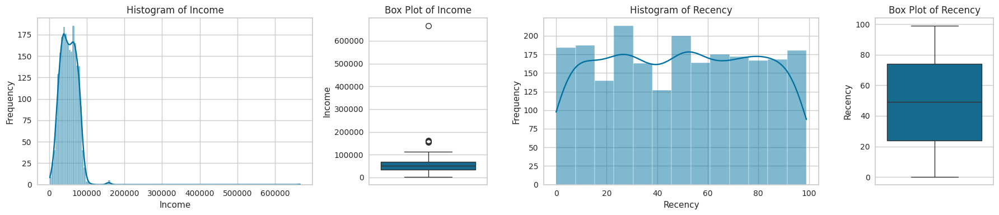


--- Household Info ---


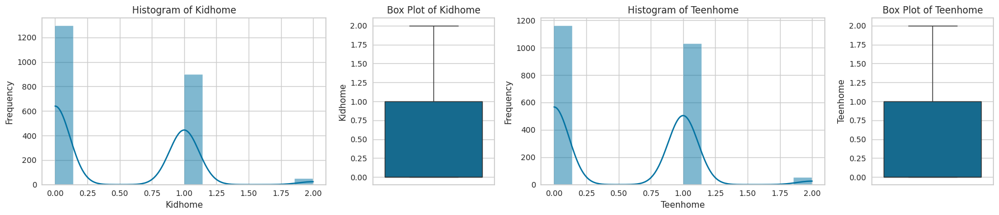


--- Spending Info ---


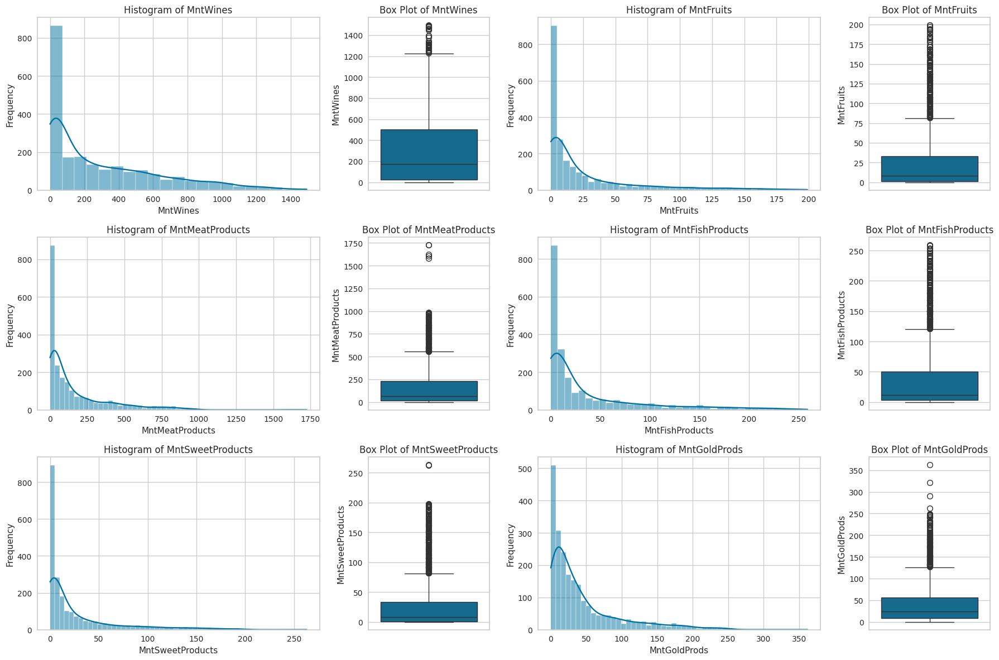


--- Purchase Info ---


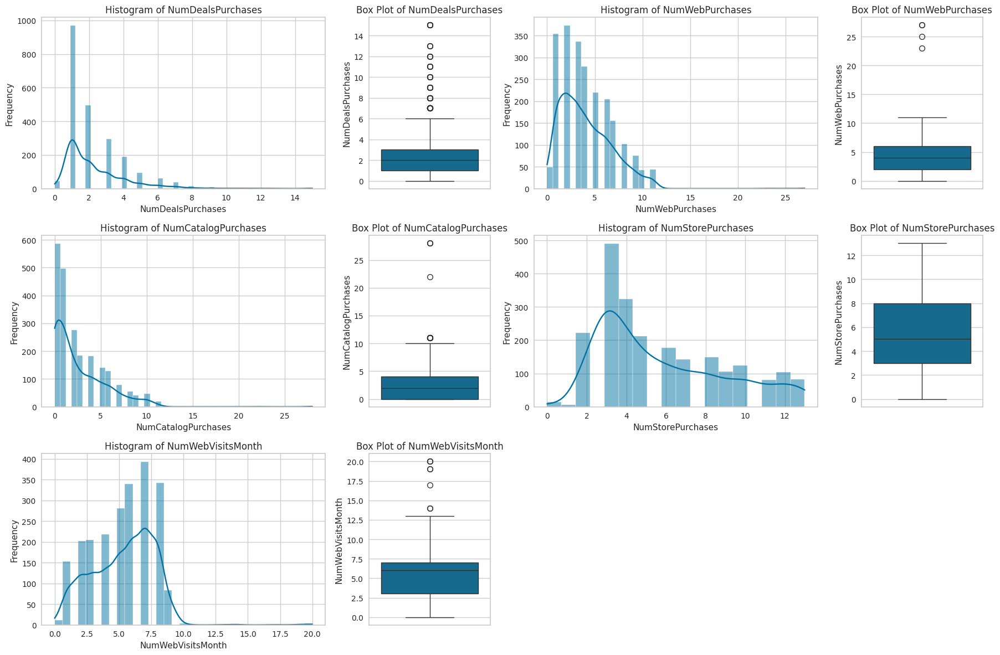


--- Campaign Info ---


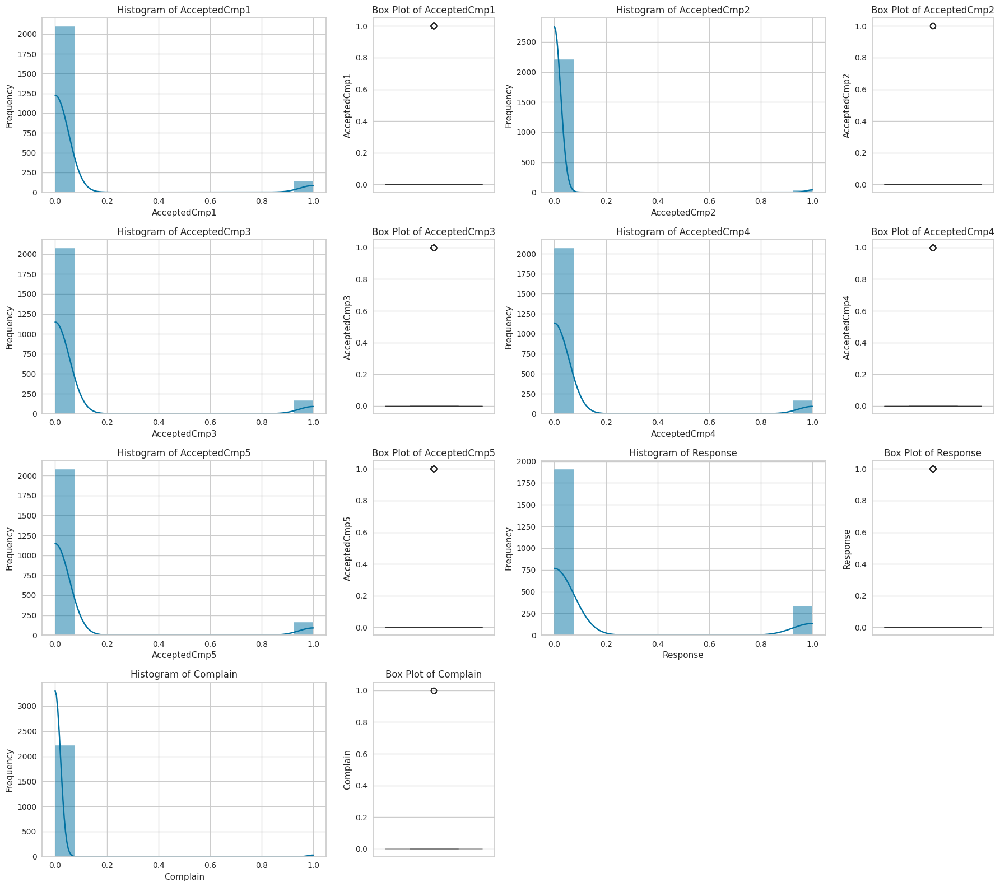


Bar plot for 'Education':


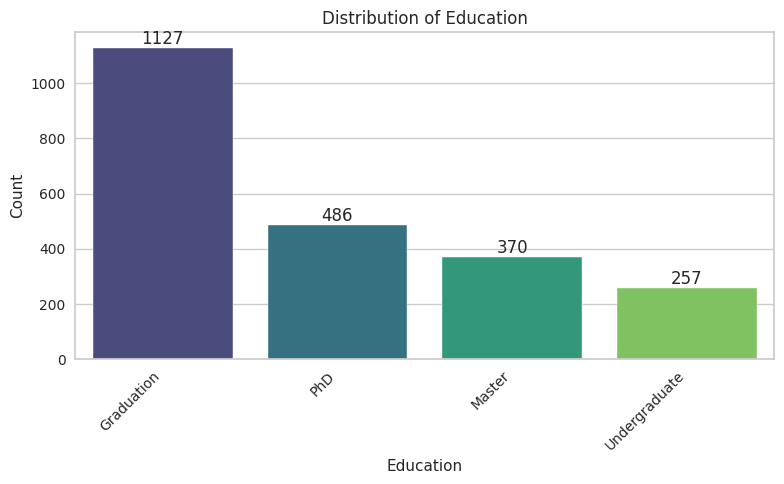


Bar plot for 'Marital_Status':


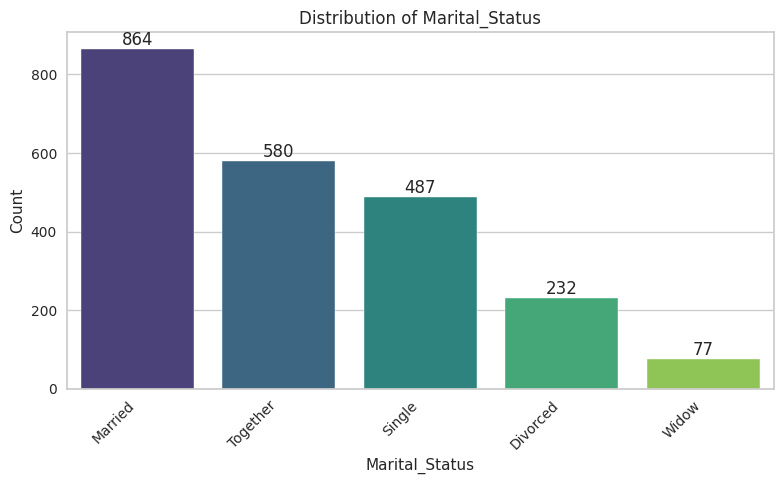

In [79]:
# Select all numerical columns from the original DataFrame
numerical_cols_original = df.select_dtypes(include=np.number).columns.tolist()

# Define logical groups of numerical columns for visualization in a dictionary
col_groups = {
    'Customer Info': ['ID', 'Year_Birth', 'Income', 'Recency', 'Dt_Customer'],
    'Household Info': ['Kidhome', 'Teenhome'],
    'Spending Info': ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'],
    'Purchase Info': ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth'],
    'Campaign Info': ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response', 'Complain', 'Z_CostContact', 'Z_Revenue']
}

# Set the style for the plots
sns.set_style("whitegrid")

print("Histograms and Box Plots of ALL Numerical Features (Before Outlier Handling) - Grouped:")

# Iterate through groups and create separate figures for each group
for group_name, cols in col_groups.items():
    existing_cols_in_group = [col for col in cols if col in numerical_cols_original]

    if existing_cols_in_group:
        print(f"\n--- {group_name} ---")

        n_features_in_group = len(existing_cols_in_group)
        n_cols_group = 4 # 2 histogram/boxplot pairs per row (Hist1, Box1, Hist2, Box2)
        n_rows_group = (n_features_in_group + 1) // 2 # Number of rows needed for the features in this group

        # Create a new figure and subplots for this group with specified width ratios
        # We need 4 columns: Hist1 (0.35), Box1 (0.15), Hist2 (0.35), Box2 (0.15) - approximately 70/30 split per pair
        fig_group, axes_group = plt.subplots(n_rows_group, n_cols_group, figsize=(18, n_rows_group * 4),
                                             gridspec_kw={'width_ratios': [0.35, 0.15, 0.35, 0.15]})

        # Ensure axes is a 2D array even if there's only one row or one column
        if n_rows_group == 1 and n_cols_group == 1:
             axes_group = np.array([[axes_group]])
        elif n_rows_group == 1:
             axes_group = np.array([axes_group])
        elif n_cols_group == 1:
             axes_group = np.array([axes_group]).T


        # Plot histogram and box plot for each numerical column in the group (two per row)
        for i in range(n_features_in_group):
            col = existing_cols_in_group[i]
            row_idx = i // 2  # Determine the row index
            col_start_idx = (i % 2) * 2 # Determine the starting column index (0 or 2)

            # Histogram
            sns.histplot(data=df, x=col, kde=True, ax=axes_group[row_idx, col_start_idx])
            axes_group[row_idx, col_start_idx].set_title(f'Histogram of {col}')
            axes_group[row_idx, col_start_idx].set_xlabel(col)
            axes_group[row_idx, col_start_idx].set_ylabel('Frequency')

            # Box plot
            sns.boxplot(data=df, y=col, ax=axes_group[row_idx, col_start_idx + 1])
            axes_group[row_idx, col_start_idx + 1].set_title(f'Box Plot of {col}')
            axes_group[row_idx, col_start_idx + 1].set_ylabel(col)


        # Hide any unused subplots in the last row if the number of features is odd
        if n_features_in_group % 2 != 0:
            if n_features_in_group % 2 == 1: # If there's one feature left in the last row
                 fig_group.delaxes(axes_group[n_rows_group-1, 2])
                 fig_group.delaxes(axes_group[n_rows_group-1, 3])


        plt.tight_layout()
        plt.show()


# --- Univariate Analysis for Categorical Features ---

categorical_cols = ['Education', 'Marital_Status']

for col in categorical_cols:
    # Calculate value counts for ordering
    value_counts = df[col].value_counts()

    print(f"\nBar plot for '{col}':")
    # Create a bar plot
    plt.figure(figsize=(8, 5))
    ax = sns.countplot(data=df, x=col, order=value_counts.index, palette='viridis')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right') # Rotate labels for better readability if needed

    # Add count labels on top of the bars
    for container in ax.containers:
        ax.bar_label(container)

    plt.tight_layout()
    plt.show()

##### **Univariate Analysis Observations**

Based on the histograms, box plots, and count plots of the original data, we can make the following observations about the univariate distributions of our features:

**Numerical Features (Histograms and Box Plots):**

*   **Skewness:** Many numerical features, particularly the spending (`Mnt_`) columns, purchase frequency (`Num_`) columns, `Income`, and `TotalSpending`, exhibit significant **right-skewness**. This is evident from the long tails extending to the right in the histograms and the box plots where the median line is closer to the bottom of the box and the upper whisker is much longer than the lower one. `Recency` appears more uniformly distributed. `Age` and `Customer_Tenure_Days` show distributions that are somewhat less skewed but still not perfectly symmetrical.
*   **Outliers:** The box plots clearly highlight the presence of **extreme outliers** in several features, most notably in `Income` (the very high value), `Age` (the very low birth year resulting in a high age), and many of the `Mnt_` and `Num_` columns (very high spending or purchase counts). These outliers appear as individual points far above the whiskers in the box plots.
*   **Binary/Low-Cardinality Counts:** Features like `Kidhome`, `Teenhome`, `AcceptedCmp_` campaign flags, `Complain`, and `Response` are clearly binary or have very low cardinality (0, 1, 2). Their histograms are concentrated at these few values, and box plots show a limited range, confirming their discrete nature.

**Categorical Features (Bar Plots):**

*   **Education:** The 'Education' distribution shows that **Graduation** is the most frequent education level among customers, followed by PhD, Master, 2n Cycle, and Basic. We also note that **'2n Cycle' and 'Basic' have relatively lower counts** compared to the higher education levels.
*   **Marital Status:** The 'Marital\_Status' distribution indicates that **Married** and **Together** are the most common marital statuses, followed by Single and Divorced. We observe that categories like **'Widow', 'Alone', 'Absurd', and 'YOLO' have very low frequencies**, with 'Alone', 'Absurd', and 'YOLO' being particularly rare.

**Overall Summary:**

The univariate analysis before preprocessing confirms the presence of significant data quality issues in numerical features, particularly **outliers and strong right-skewness**, which will need to be addressed through techniques like capping and transformation. It also provides a clear picture of the distribution of customers across different categorical segments (Education and Marital Status). The observation of **low-frequency categories in 'Marital\_Status' and 'Education'** means that **regrouping these categories will be a necessary step** during data preprocessing to ensure robust categorical features for segmentation. These observations directly inform the subsequent data cleaning and transformation steps to prepare the data for effective customer segmentation.

#### **Visualizing Numerical Distributions After Capping**
Let's visualize only the histograms of the numerical features in the `df_capped` DataFrame. This will help us assess the impact of capping on the distribution shapes and see if skewness still remains before applying transformations.

Histograms of ALL Numerical Features (After Capping) - Grouped:


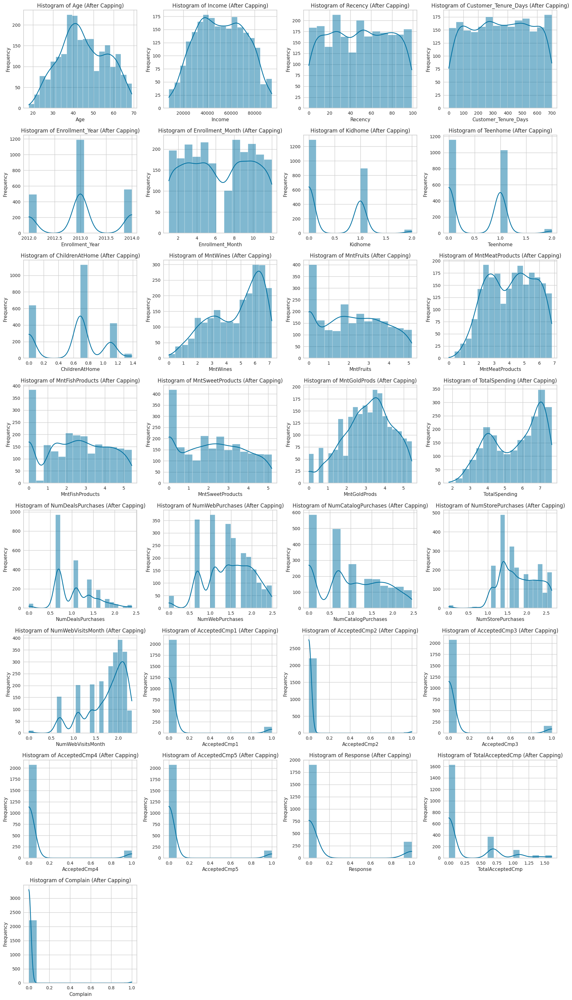

In [80]:
# Select numerical columns from the capped DataFrame
numerical_cols_capped = df_capped.select_dtypes(include=np.number).columns.tolist()

# Define logical groups of numerical columns for visualization (using the same groups as before)
col_groups = {
    'Customer Info (Capped)': ['Age', 'Income', 'Recency', 'Customer_Tenure_Days', 'Enrollment_Year', 'Enrollment_Month'],
    'Household Info (Capped)': ['Kidhome', 'Teenhome', 'ChildrenAtHome'],
    'Spending Info (Capped)': ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'TotalSpending'],
    'Purchase Info (Capped)': ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth'],
    'Campaign Info (Capped)': ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response', 'TotalAcceptedCmp', 'Complain']
}

# Flatten the list of columns in the desired order for plotting
ordered_cols_for_viz = []
for group_name, cols in col_groups.items():
    # Ensure the columns in the group exist in the DataFrame before adding them to the ordered list
    existing_cols_in_group = [col for col in cols if col in numerical_cols_capped]
    ordered_cols_for_viz.extend(existing_cols_in_group)

# Set the style for the plots
sns.set_style("whitegrid")

print("Histograms of ALL Numerical Features (After Capping) - Grouped:")

# Determine the number of rows and columns for the subplot grid (using 4 columns for better horizontal spacing)
n_cols = 4
n_rows = (len(ordered_cols_for_viz) + n_cols - 1) // n_cols

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Plot a histogram for each numerical column
for i, col in enumerate(ordered_cols_for_viz):
    sns.histplot(data=df_capped, x=col, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col} (After Capping)')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

##### **Observation on Handling Outliers:**

The descriptive statistics for numerical columns **after applying winsorization (capping) in the Data Preprocessing section** reveal the impact of this outlier treatment:

* For **`Income`**, both the minimum and maximum values have been capped (at the 1st and 99th percentiles respectively). The minimum is now **\$7705.92** (originally \$1730.0), and the maximum is now **\$94437.68** (originally \$666,666.0). This significantly reduces the influence of extreme low and high incomes.
* For **`Age`**, the maximum value has been capped at **69.0 years** (the 99th percentile), significantly reducing the extreme value of 121 years. The minimum age remains 18.0.
* For the **other winsorized numerical columns** (including Recency, spending amounts, purchase frequencies, etc.), the maximum values have been capped (typically at the 99th percentile). This significantly reduces the impact of their extreme high values. For example, `MntMeatProducts` max is now **\$915.00** (originally \$1725.00) and `NumWebPurchases` max is now **11.00** (originally 27.00).

Looking at the descriptive statistics after capping, many features still exhibit significant right-skewness, indicated by the mean being notably higher than the median and a large difference between the 75th percentile and the maximum value. Examples of features that still appear skewed include: **`MntWines`, `MntMeatProducts`, `TotalSpending`, `NumCatalogPurchases`, and `NumWebVisitsMonth`**. **These remaining skewness issues will be addressed with transformations in the Data Preprocessing section.**

By capping the outliers in these numerical features, we have reduced the influence of these extreme values on our dataset. This is an important step in preparing the data for distance-based clustering algorithms like K-Means, as the capped data should be less sensitive to these extreme points, potentially leading to more robust clustering results. We now have a `df_capped` DataFrame ready for further preprocessing and modeling with outlier handling applied.

### **Visualizing Numerical Distributions After Log1p Transformation**
Let's visualize the histograms specifically for the numerical features that were transformed using `log1p`. This will help us assess how effectively the transformation has made these distributions more symmetrical.

Histograms for Selected Log1p Transformed Features - Grouped:


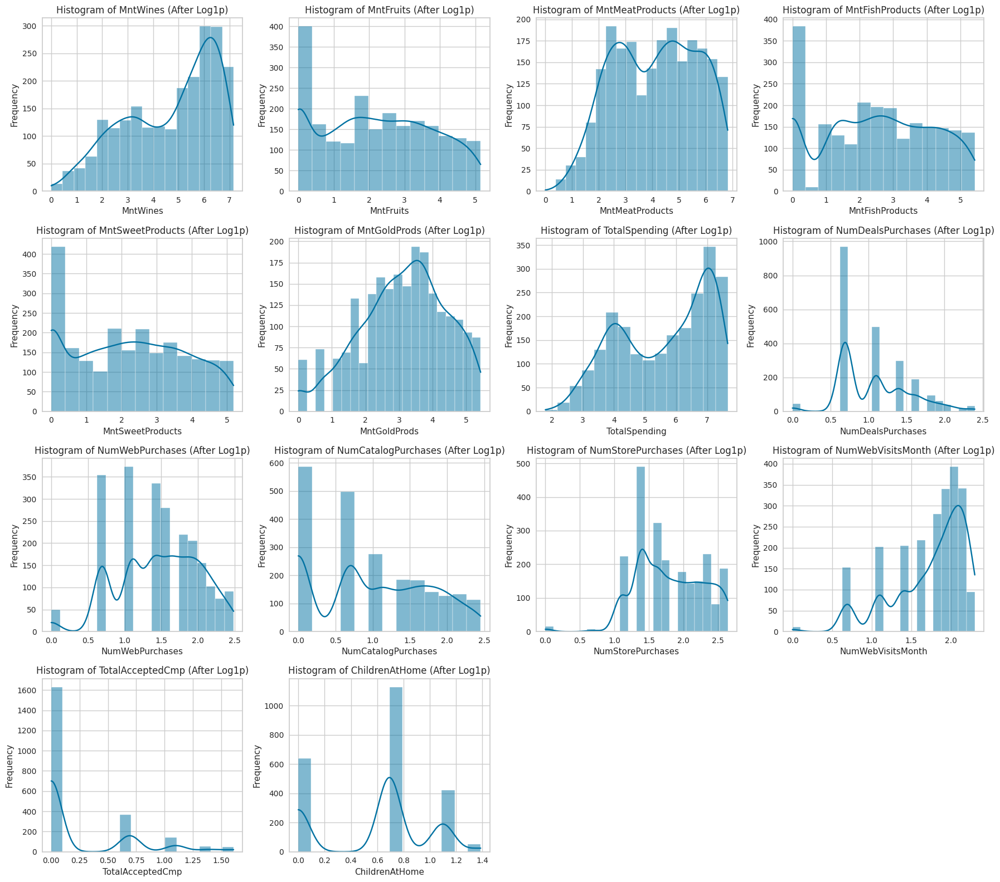

In [81]:
# Define the list of numerical columns that were log1p transformed
cols_for_log_transform = [
    'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
    'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
    'NumWebVisitsMonth', 'TotalSpending', 'TotalAcceptedCmp', 'ChildrenAtHome'
]

# Note: Assuming log1p transformation has already been applied to these columns in df_capped

# Define logical groups for visualization (using a subset of previous groups)
col_groups_transformed_viz = {
    'Spending Info (Log1p)': ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'TotalSpending'],
    'Purchase Info (Log1p)': ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth'],
    'Campaign & Household (Log1p)': ['TotalAcceptedCmp', 'ChildrenAtHome']
}

# Flatten the list of columns in the desired order for plotting
ordered_cols_transformed_viz = []
for group_name, cols in col_groups_transformed_viz.items():
    # Ensure the columns in the group exist in the DataFrame before adding them to the ordered list
    existing_cols_in_group = [col for col in cols if col in cols_for_log_transform]
    ordered_cols_transformed_viz.extend(existing_cols_in_group)

# Set the style for the plots
sns.set_style("whitegrid")

print("Histograms for Selected Log1p Transformed Features - Grouped:")

# Determine the number of rows and columns for the subplot grid (using 4 columns for consistency)
n_cols = 4
n_rows = (len(ordered_cols_transformed_viz) + n_cols - 1) // n_cols

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Plot a histogram for each transformed column
for i, col in enumerate(ordered_cols_transformed_viz):
    sns.histplot(data=df_capped, x=col, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col} (After Log1p)')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

##### **Observation on Univariate Distributions After Log1p Transformation:**

Looking at the descriptive statistics of the numerical features **after applying the `log1p` transformation in the Data Preprocessing section**, we can confirm its impact on their distributions:

* **Reduced Right-Skewness (Statistical):** For most of the features that were heavily right-skewed before transformation, the `log1p` transformation has significantly reduced the asymmetry. The mean and median values in the descriptive statistics are now closer together compared to before transformation, which is a statistical indicator of reduced skewness.
* **Range Compression:** The descriptive statistics show that the range of values in the transformed features has been compressed, particularly for features that had very high maximum values before transformation.
* **Preservation of Zeros:** Features that had a minimum value of 0 before transformation still have a minimum value of 0 after `log1p` (since log1p(0)=0).

In summary, the `log1p` transformation, supported by the descriptive statistics, demonstrates that this step was effective in making the distributions of the skewed numerical features more symmetrical. This is a crucial step in preparing the data for distance-based clustering algorithms that are sensitive to feature distribution and scale.

### **Bivariate Analysis**

Bivariate analysis explores the relationship between pairs of variables. Understanding how different features interact with each other can reveal patterns and insights that are not apparent in univariate analysis. This is particularly valuable for customer segmentation, as it can highlight feature combinations that are strongly associated with distinct customer behaviors or characteristics.

In this section, we will visualize the relationships between key numerical features using scatter plots and a correlation matrix. We will also explore the relationships between categorical features and numerical features.

#### **2D Visualizations of Key Numerical Relationships**

Let's start by visualizing the relationships between some key pairs of numerical features using scatter plots. This allows us to visually inspect for correlations, clusters, or other patterns that might exist between these variables. We will focus on pairs of features that are likely to be important for customer segmentation, such as spending amounts, income, age, and engagement metrics.

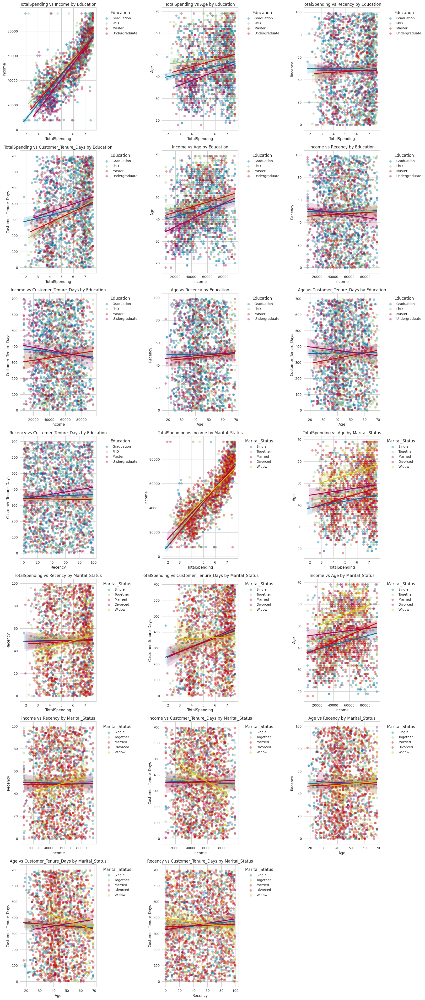

In [82]:
# Select some key numerical features for 2D visualization
# Using the capped DataFrame (df_capped) as it has handled outliers and transformations
key_numerical_cols = ['TotalSpending', 'Income', 'Age', 'Recency', 'Customer_Tenure_Days']

# Select categorical columns to use as hue (these are the original columns before encoding)
categorical_hues = ['Education', 'Marital_Status']

# Determine the number of unique pairs of key numerical columns
n_numerical_pairs = len(key_numerical_cols) * (len(key_numerical_cols) - 1) // 2

# Calculate the total number of unique (numerical pair, hue) combinations
total_combinations = n_numerical_pairs * len(categorical_hues)

# Determine the number of columns for the subplot grid
n_cols = 3

# Determine the number of rows needed
n_rows = (total_combinations + n_cols - 1) // n_cols

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 6)) # Increased figure height slightly
axes = axes.flatten()

plot_idx = 0
# Iterate through each categorical hue
for hue_col in categorical_hues:
    # Get unique categories for the current hue column
    unique_categories = df_capped[hue_col].unique()

    # Iterate through each unique pair of numerical columns
    for i in range(len(key_numerical_cols)):
        for j in range(i + 1, len(key_numerical_cols)):
            if plot_idx < len(axes):
                col1 = key_numerical_cols[i]
                col2 = key_numerical_cols[j]

                # Plot regplot for each category on the same axes
                for category in unique_categories:
                    subset_df = df_capped[df_capped[hue_col] == category]
                    sns.regplot(data=subset_df, x=col1, y=col2, ax=axes[plot_idx], scatter_kws={'alpha':0.4}, label=category, ci=95)

                axes[plot_idx].set_title(f'{col1} vs {col2} by {hue_col}')
                axes[plot_idx].set_xlabel(col1)
                axes[plot_idx].set_ylabel(col2)
                axes[plot_idx].legend(title=hue_col, bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside

                plot_idx += 1

# Hide any unused subplots
for k in range(plot_idx, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()

##### **Observation on 2D Visualizations of Key Numerical Relationships**

The scatter plots visualizing the relationships between key numerical features, with 'Education' and 'Marital_Status' as hues and now including regression lines for each category, reveal several interesting patterns and potential groupings:

**General Trends (Across Hues):**

*   **TotalSpending vs. Income:** There appears to be a positive correlation between `TotalSpending` and `Income`. Higher income generally seems to be associated with higher total spending. The regression lines for different categories within 'Education' and 'Marital_Status' might show slightly different slopes or intercepts, suggesting that the strength or nature of this relationship could vary by educational background or marital status.
*   **Spending vs. Spending:** Many of the individual spending categories (`Mnt_` columns) show positive correlations with `TotalSpending`, which is expected as they are components of the total. Relationships between different spending categories (e.g., `MntWines` vs. `MntMeatProducts`) might show some clustering, indicating certain product preferences might be associated. The regression lines here can visually reinforce these positive relationships.
*   **Recency vs. Other Features:** `Recency` (days since last purchase) generally doesn't show strong linear relationships with Income, Age, or Spending, as indicated by relatively flat regression lines. This suggests that how recently a customer purchased might be somewhat independent of these factors, or the relationship is not linear. The regression lines for different categories within the hues also tend to be flat.
*   **Customer_Tenure_Days vs. Other Features:** `Customer_Tenure_Days` might show some weak positive correlation with `TotalSpending` or `Income`, potentially indicating that longer-term customers or higher-income customers tend to spend more, but this is not always clearly defined. The regression lines might show slight upward slopes. Age and Tenure might show some relationship depending on the customer base acquisition strategy, and the regression lines can help visualize this.

**Impact of Hue (Education & Marital Status) and Regression Lines:**

*   **Education:**
    *   When using 'Education' as hue, the separate regression lines for each education level can visually highlight differences in the *linear* relationship between the numerical features. For instance, in the `Income` vs. `TotalSpending` plot, the regression lines for different education levels might have different slopes, suggesting that the rate at which spending increases with income varies by education. The positioning of these lines can also indicate that some education groups tend to have higher income or spending levels than others.
    *   Relationships between spending on different product categories might also show variations by education level, indicated by the slopes and positions of the regression lines for each category.
*   **Marital Status:**
    *   Using 'Marital_Status' as hue, the separate regression lines can reveal how the linear relationships between numerical features differ based on relationship status. For example, in the `Income` vs. `TotalSpending` plot, 'Married' or 'Together' individuals might have different regression lines compared to 'Single' or 'Divorced' individuals, reflecting differences in how income translates to spending or overall spending levels. The lines might also help differentiate groups based on features like the number of children at home.

**Potential for Clustering:**

The visual exploration with scatter plots, now enhanced with regression lines for different categories, continues to reinforce the idea that distinct customer segments likely exist. The differences in the slopes and positions of the regression lines across education levels and marital statuses, combined with the visual density of points, suggest that these demographic and behavioral traits are important dimensions for effective clustering. While the regression lines only capture linear trends, they can still help to visually separate groups and indicate where differences in relationships lie, supporting the idea that a clustering algorithm should be able to identify meaningful groups.

#### **Correlation Heatmap of Numerical Features**

A correlation heatmap provides a visual representation of the correlation coefficients between all pairs of numerical features. The color intensity indicates the strength and direction of the correlation (positive or negative). This helps us quickly identify features that are highly correlated with each other, which can be useful for feature selection and understanding relationships.

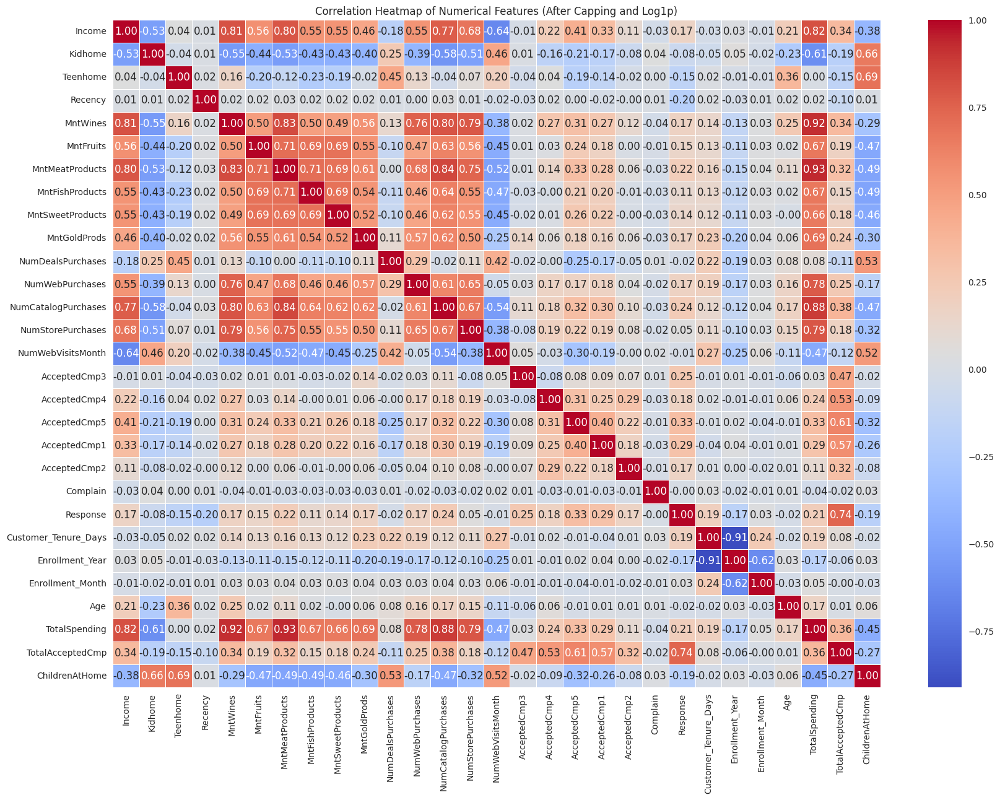

In [83]:
# Calculate the correlation matrix for all numerical columns in the capped DataFrame
numerical_cols_capped = df_capped.select_dtypes(include=np.number).columns.tolist()
correlation_matrix = df_capped[numerical_cols_capped].corr()

# Plot the correlation heatmap with increased figure size for better annotation visibility
plt.figure(figsize=(20, 14)) # Increased figure size
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=".5") # Set annot=True to show values
plt.title('Correlation Heatmap of Numerical Features (After Capping and Log1p)')
plt.show()

In [84]:
# Calculate the correlation matrix for all numerical columns
# Using the capped DataFrame (df_capped) as it has handled outliers and transformations
numerical_cols_capped = df_capped.select_dtypes(include=np.number).columns.tolist()
correlation_matrix = df_capped[numerical_cols_capped].corr()

# Stack the correlation matrix to get a Series of pairwise correlations
# The index will be a MultiIndex of (feature1, feature2)
stacked_correlations = correlation_matrix.stack()

# --- Top 10 Highest Absolute Correlations ---

# Get the absolute values of the stacked correlations
abs_stacked_correlations = stacked_correlations.abs()

# Sort by absolute value in descending order
sorted_abs_correlations = abs_stacked_correlations.sort_values(ascending=False)

# Filter out self-correlations (where feature1 is the same as feature2)
# and duplicate pairs (e.g., (A, B) and (B, A))
# We can achieve this by comparing the alphabetical order of feature names in the index
filtered_abs_correlations = sorted_abs_correlations[sorted_abs_correlations.index.get_level_values(0) < sorted_abs_correlations.index.get_level_values(1)]

# Get the top 10 highest absolute correlations
top_10_abs_correlations = filtered_abs_correlations.head(10)

# Format the output into a DataFrame for clear display
top_10_abs_correlations_df = top_10_abs_correlations.reset_index()
top_10_abs_correlations_df.columns = ['Feature 1', 'Feature 2', 'Absolute Correlation']

print("Top 10 Highest Absolute Correlations:")
display(top_10_abs_correlations_df)


# --- Top 10 Lowest (Most Negative) Correlations ---

# Sort the original stacked correlations in ascending order (most negative first)
sorted_negative_correlations = stacked_correlations.sort_values(ascending=True)

# Filter out self-correlations and duplicate pairs (A,B and B,A)
# We use the same alphabetical check as before
filtered_negative_correlations = sorted_negative_correlations[sorted_negative_correlations.index.get_level_values(0) < sorted_negative_correlations.index.get_level_values(1)]

# Get the top 10 lowest (most negative) correlations
top_10_lowest_correlations = filtered_negative_correlations.head(10)

# Format the output into a DataFrame
top_10_lowest_correlations_df = top_10_lowest_correlations.reset_index()
top_10_lowest_correlations_df.columns = ['Feature 1', 'Feature 2', 'Correlation']

print("\nTop 10 Lowest (Most Negative) Correlations:")
display(top_10_lowest_correlations_df)


# --- Top 10 Highest (Most Positive) Correlations ---

# Sort the original stacked correlations in descending order (most positive first)
sorted_positive_correlations = stacked_correlations.sort_values(ascending=False)

# Filter out self-correlations and duplicate pairs (A,B and B,A)
# We use the same alphabetical check as before
filtered_positive_correlations = sorted_positive_correlations[sorted_positive_correlations.index.get_level_values(0) < sorted_positive_correlations.index.get_level_values(1)]

# Get the top 10 highest (most positive) correlations
top_10_highest_correlations = filtered_positive_correlations.head(10)

# Format the output into a DataFrame
top_10_highest_correlations_df = top_10_highest_correlations.reset_index()
top_10_highest_correlations_df.columns = ['Feature 1', 'Feature 2', 'Correlation']

print("\nTop 10 Highest (Most Positive) Correlations:")
display(top_10_highest_correlations_df)

Top 10 Highest Absolute Correlations:


,Feature 1,Feature 2,Absolute Correlation
0,MntMeatProducts,TotalSpending,0.934266
1,MntWines,TotalSpending,0.924113
2,Customer_Tenure_Days,Enrollment_Year,0.910393
3,NumCatalogPurchases,TotalSpending,0.882531
4,MntMeatProducts,NumCatalogPurchases,0.843908
5,MntMeatProducts,MntWines,0.829045
6,Income,TotalSpending,0.815754
7,Income,MntWines,0.811761
8,MntWines,NumCatalogPurchases,0.803620
9,Income,MntMeatProducts,0.796611



Top 10 Lowest (Most Negative) Correlations:


,Feature 1,Feature 2,Correlation
0,Customer_Tenure_Days,Enrollment_Year,-0.910393
1,Income,NumWebVisitsMonth,-0.637157
2,Enrollment_Month,Enrollment_Year,-0.620579
3,Kidhome,TotalSpending,-0.605578
4,Kidhome,NumCatalogPurchases,-0.578371
5,Kidhome,MntWines,-0.551746
6,NumCatalogPurchases,NumWebVisitsMonth,-0.538140
7,Kidhome,MntMeatProducts,-0.534474
8,Income,Kidhome,-0.525794
9,MntMeatProducts,NumWebVisitsMonth,-0.515756



Top 10 Highest (Most Positive) Correlations:


,Feature 1,Feature 2,Correlation
0,MntMeatProducts,TotalSpending,0.934266
1,MntWines,TotalSpending,0.924113
2,NumCatalogPurchases,TotalSpending,0.882531
3,MntMeatProducts,NumCatalogPurchases,0.843908
4,MntMeatProducts,MntWines,0.829045
5,Income,TotalSpending,0.815754
6,Income,MntWines,0.811761
7,MntWines,NumCatalogPurchases,0.803620
8,Income,MntMeatProducts,0.796611
9,NumStorePurchases,TotalSpending,0.793312


##### **Observation on Correlation Heatmap and Top 10 Correlations**

The correlation heatmap and the lists of top 10 correlations (absolute, lowest, and highest) provide valuable insights into the linear relationships between the numerical features:

**Key Positive Correlations:**

*   There are very strong positive correlations between **`TotalSpending`** and several individual spending categories, particularly **`MntMeatProducts`** (0.93), **`MntWines`** (0.92), and **`NumCatalogPurchases`** (0.88). **Note:** These high correlations between `TotalSpending` and the individual `Mnt_` columns are expected as `TotalSpending` is derived from the sum of these columns. This reflects the mathematical relationship rather than a purely behavioral one, though it still indicates which individual spending categories contribute most to overall spending.
*   Strong positive correlations also exist between various individual spending categories themselves (e.g., `MntMeatProducts` and `MntWines` at 0.83, `MntMeatProducts` and `NumCatalogPurchases` at 0.84, `MntWines` and `NumCatalogPurchases` at 0.80). This suggests that customers who purchase heavily in one of these categories are likely to purchase heavily in others, indicating a segment of high-value, diverse spenders.
*   `Income` shows strong positive correlations with `TotalSpending` (0.82), `MntWines` (0.81), and `MntMeatProducts` (0.80). This confirms that higher income is strongly associated with higher overall spending and particularly with spending on wine and meat products.

**Key Negative Correlations:**

*   A very strong negative correlation exists between **`Customer_Tenure_Days`** and **`Enrollment_Year`** (-0.91). This is expected, as `Customer_Tenure_Days` is calculated relative to the latest date in the dataset, so customers who enrolled in earlier years will have a higher tenure (more days). This is an artifact of feature engineering and doesn't represent a behavioral relationship.
*   `Income` has a notable negative correlation with **`NumWebVisitsMonth`** (-0.64). This is an interesting finding, suggesting that customers with higher incomes tend to visit the website less frequently in the last month. This could imply that higher-income customers prefer other purchase channels (like catalog or in-store) or are less frequent online browsers.
*   Features related to having children at home (`Kidhome`, and consequently `ChildrenAtHome`) show moderate to strong negative correlations with various spending categories, including `TotalSpending` (-0.61), `NumCatalogPurchases` (-0.58), `MntWines` (-0.55), and `MntMeatProducts` (-0.53). This suggests that the presence of young children might lead to lower spending in these categories, possibly due to different priorities or reduced disposable income/time.
*   `NumCatalogPurchases` has a moderate negative correlation with `NumWebVisitsMonth` (-0.54), suggesting that customers who buy more through catalogs might visit the website less often, indicating potentially different shopping preferences or habits between these groups.

**Weak Correlations:**

*   Many other pairs of features show weak correlations (values close to 0), indicating little to no *linear* relationship between them (e.g., `Recency` with most features, campaign acceptance flags with many spending/purchase features). This doesn't mean there's no relationship at all, but if a relationship exists, it's likely non-linear or influenced by other factors.

**Overall Summary:**

The correlation analysis confirms several expected relationships (e.g., income and spending) and highlights important inverse relationships (e.g., income with web visits, children at home with spending). The strong positive correlations among spending and catalog purchase features suggest a high-value customer segment. The strong negative correlations with features like `Kidhome` point towards family structure as a significant factor influencing purchasing behavior. While the heatmap and top correlations focus on linear relationships, they provide a crucial quantitative foundation for understanding feature dependencies and will inform our feature selection process for clustering.

#### **Visualizing Specific High Correlations**

Based on the correlation analysis, let's visualize some of the most notable correlations using scatter plots to see the distribution of points and further understand these relationships, avoiding the direct component relationships like individual `Mnt_` columns vs. `TotalSpending`.

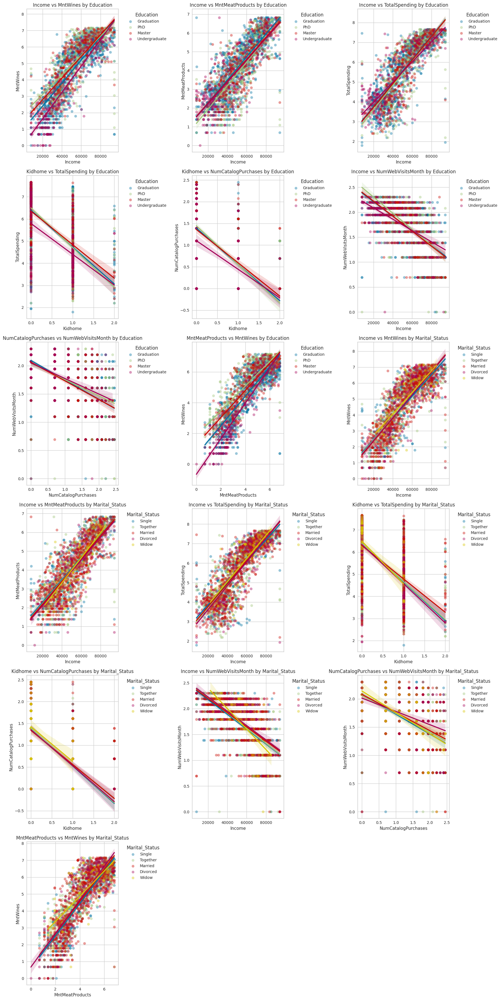

In [85]:
# Select some interesting highly correlated pairs based on the top 10 lists
# Avoiding pairs where TotalSpending is directly one of the Mnt_ components
highly_correlated_pairs_to_viz = [
    ('Income', 'MntWines'), # High positive correlation
    ('Income', 'MntMeatProducts'), # High positive correlation
    ('Income', 'TotalSpending'), # High positive correlation (though TotalSpending includes Income relation indirectly)
    ('Kidhome', 'TotalSpending'), # Strong negative correlation
    ('Kidhome', 'NumCatalogPurchases'), # Strong negative correlation
    ('Income', 'NumWebVisitsMonth'), # Strong negative correlation
    ('NumCatalogPurchases', 'NumWebVisitsMonth'), # Moderate negative correlation
    ('MntMeatProducts', 'MntWines') # High positive correlation between two spending categories
]

# Select categorical columns to use as hue (these are the original columns before encoding)
categorical_hues = ['Education', 'Marital_Status']

# Calculate the total number of combinations (highly correlated pairs * number of hues)
total_combinations = len(highly_correlated_pairs_to_viz) * len(categorical_hues)

# Determine the number of columns for the subplot grid
n_cols = 3
n_rows = (total_combinations + n_cols - 1) // n_cols

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 6)) # Increased figure height slightly
axes = axes.flatten()

plot_idx = 0
# Iterate through each categorical hue
for hue_col in categorical_hues:
    # Get unique categories for the current hue column
    unique_categories = df_capped[hue_col].unique()

    # Iterate through each highly correlated pair
    for col1, col2 in highly_correlated_pairs_to_viz:
        if plot_idx < len(axes):
            # Plot regplot for each category on the same axes
            for category in unique_categories:
                subset_df = df_capped[df_capped[hue_col] == category]
                sns.regplot(data=subset_df, x=col1, y=col2, ax=axes[plot_idx], scatter_kws={'alpha':0.4}, label=category, ci=95)

            axes[plot_idx].set_title(f'{col1} vs {col2} by {hue_col}')
            axes[plot_idx].set_xlabel(col1)
            axes[plot_idx].set_ylabel(col2)
            axes[plot_idx].legend(title=hue_col, bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside

            plot_idx += 1

# Hide any unused subplots
for k in range(plot_idx, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()

##### **Observation on Scatter Plots of Specific High Correlations**

Examining the scatter plots for the specific highly correlated pairs, now with regression lines and colored by 'Education' and 'Marital_Status', provides further visual confirmation and nuanced insights into these relationships:

*   **Income vs. Spending (`MntWines`, `MntMeatProducts`, `TotalSpending`):** The positive linear trends are clearly visible with the regression lines. The different colored lines (for Education and Marital Status) often show slightly different slopes or intercepts, visually reinforcing that the relationship between income and spending can vary depending on these demographic factors. For example, certain education levels or marital statuses might consistently show higher spending at similar income levels compared to others. **Education and Marital Status appear to be factors that influence how income translates into spending.**

*   **Kidhome vs. Spending/Purchases (`TotalSpending`, `NumCatalogPurchases`):** The negative linear trends are apparent. The regression lines for different categories of Education and Marital Status help visualize how the presence of children might impact spending or catalog purchases differently across these groups. For instance, the negative slope might be steeper for certain education levels, suggesting a stronger inverse relationship between having children and spending for those groups. **The number of children at home, influenced by Marital Status and potentially Education, seems to be a key factor impacting spending and purchase behavior.**

*   **Income vs. NumWebVisitsMonth:** The negative linear trend is visible. The regression lines for different categories can show if the rate at which web visits decrease with increasing income varies by education or marital status. **Education and Income levels, potentially linked to Marital Status, could influence online browsing habits.**

*   **NumCatalogPurchases vs. NumWebVisitsMonth:** The negative linear trend is seen. The regression lines can highlight if this inverse relationship between catalog purchases and web visits differs across educational backgrounds or marital statuses. **Education and Marital Status might play a role in preferred shopping channels (catalog vs. web visits).**

*   **MntMeatProducts vs. MntWines:** The positive linear trend is clear, showing that customers who spend more on meat also tend to spend more on wine. The regression lines for different categories allow us to see if this co-spending pattern varies by education or marital status. **Differences in spending on meat and wine based on Education or Marital Status suggest these demographic factors might influence product preferences.**

Overall, these plots visually confirm the strong correlations identified in the heatmap and top lists. More importantly, the use of hue and separate regression lines helps to illustrate that while a general linear trend exists for the overall customer base, the *specific nature* of that trend (slope and intercept) can be different for various segments defined by Education and Marital Status. This further supports the idea that these categorical features are important differentiators for customer segmentation.

## **Kmeans**

### **Determining the Optimal Number of Clusters (K)**

A crucial step in K-Means clustering is determining the optimal number of clusters, often denoted as 'K'. An inappropriate choice of K can lead to misleading or non-actionable segments. We will use two common methods to help us identify the best value for K:

1.  **The Elbow Method:** This method looks at the total within-cluster sum of squares (WCSS) as a function of the number of clusters. WCSS is the sum of the squared distances between each point and the centroid of its assigned cluster. As K increases, WCSS generally decreases. The "elbow point" on the plot of WCSS vs. K is where the rate of decrease sharply changes, suggesting a good balance between minimizing WCSS and the number of clusters.
2.  **The Silhouette Score:** This metric measures how similar an object is to its own cluster compared to other clusters. The silhouette score ranges from -1 to +1, where a high value indicates that the object is well-matched to its own cluster and poorly matched to neighboring clusters. We calculate the average silhouette score for different values of K and look for the K that yields the highest average score.

Let's begin by applying the **Elbow Method** to our `df_selected_for_clustering` DataFrame.

#### **Elbow Method**

We will calculate the Within-Cluster Sum of Squares (WCSS) for a range of K values and plot the results. The "elbow" in the plot will suggest a potential optimal K.

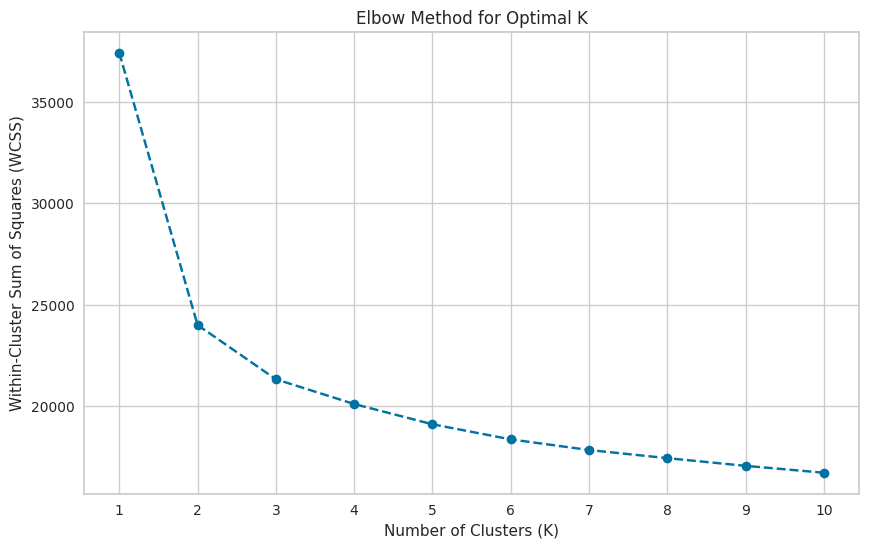

In [86]:
# Determine the range of K values to test
# It's common to test a range from 1 up to a reasonable number (e.g., 10 or 15)
range_n_clusters = range(1, 11)

# List to store WCSS for each K
wcss = []

# Fit KMeans for each K and calculate WCSS
for n_clusters in range_n_clusters:
    # Initialize KMeans
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42, n_init=10) # Use n_init to suppress warning

    # Fit KMeans to the selected data
    kmeans.fit(df_selected_for_clustering)

    # Append WCSS to the list
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

In [87]:
# Print WCSS scores for K = 1 to 5
range_n_clusters_to_print_wcss = range(1, 6)

print("WCSS scores for K=1 to K=5:")

# Assuming the wcss list from the Elbow Method code is still available
# If not, we would need to re-calculate it.
# Let's assume 'wcss' list is available from the previous Elbow Method execution (cell ac5a0243)

for i in range(len(range_n_clusters_to_print_wcss)):
    k = range_n_clusters_to_print_wcss[i]
    if i < len(wcss): # Ensure we don't go out of bounds of the wcss list
        print(f"For n_clusters = {k}, the WCSS is : {wcss[i]:.2f}")
    else:
        print(f"WCSS for n_clusters = {k} was not calculated in the previous step.")

WCSS scores for K=1 to K=5:
For n_clusters = 1, the WCSS is : 37409.53
For n_clusters = 2, the WCSS is : 23991.28
For n_clusters = 3, the WCSS is : 21316.91
For n_clusters = 4, the WCSS is : 20095.99
For n_clusters = 5, the WCSS is : 19097.96


##### **Observation on Elbow Method:**

The Elbow Method plot displays the Within-Cluster Sum of Squares (WCSS) against the number of clusters (K). As expected, the WCSS decreases as K increases, because data points are closer to their own cluster centroids when there are more clusters. We look for an "elbow point" where the rate of decrease in WCSS significantly slows down.

We calculated the WCSS for K=1 to K=5:
*   For n\_clusters = 1, the WCSS is : **37409.53**
*   For n\_clusters = 2, the WCSS is : 23991.28
*   For n\_clusters = 3, the WCSS is : 21316.91
*   For n\_clusters = 4, the WCSS is : 20095.99
*   For n\_clusters = 5, the WCSS is : 19097.96

In this plot, the decrease in WCSS is quite gradual. There isn't a very sharp or distinct elbow. However, observing the numerical values and the plot, there appears to be a noticeable change in the slope of the curve around **K = 3 or K = 4**. The substantial drop from K=1 to K=2 is followed by smaller decreases. After K=3 or K=4, the reduction in WCSS for each additional cluster becomes less significant. This suggests that adding more than 3 or 4 clusters provides diminishing returns in terms of reducing within-cluster variance.

Based on the Elbow Method alone, both K=3 and K=4 are potential candidates for the optimal number of clusters.

#### **Silhouette Score**

The Silhouette Score measures how similar an object is to its own cluster compared to other clusters. We will calculate the average silhouette score for different values of K. A higher silhouette score generally indicates better-defined clusters.

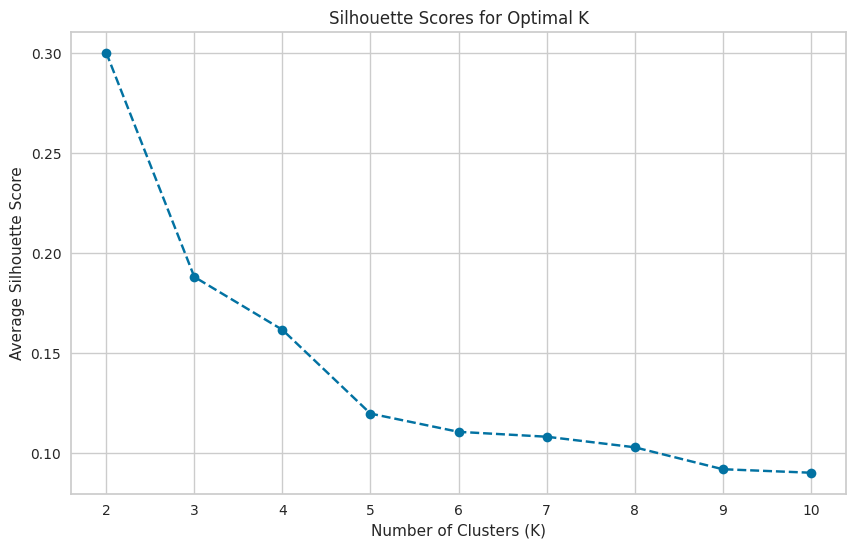

In [88]:
# Determine the range of K values to test for silhouette score
# We'll use the same range as the Elbow method, but starting from 2 (as silhouette score requires at least 2 clusters)
range_n_clusters = range(2, 11)

# List to store silhouette scores for each K
silhouette_scores = []

# Calculate silhouette score for each K
for n_clusters in range_n_clusters:
    # Initialize KMeans
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42, n_init=10)

    # Fit KMeans to the selected data and get cluster labels
    cluster_labels = kmeans.fit_predict(df_selected_for_clustering)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(df_selected_for_clustering, cluster_labels)

    # Append the silhouette score to the list
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Scores for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Average Silhouette Score')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

In [89]:
# Calculate and print silhouette scores for K = 2, 3, 4, and 5
range_n_clusters_to_print = range(2, 6)

print("Silhouette Scores for K=2 to K=5:")

for n_clusters in range_n_clusters_to_print:
    # Initialize KMeans
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42, n_init=10)

    # Fit KMeans to the selected data and get cluster labels
    cluster_labels = kmeans.fit_predict(df_selected_for_clustering)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(df_selected_for_clustering, cluster_labels)

    print(f"For n_clusters = {n_clusters}, the average silhouette_score is : {silhouette_avg:.4f}")

Silhouette Scores for K=2 to K=5:
For n_clusters = 2, the average silhouette_score is : 0.3003
For n_clusters = 3, the average silhouette_score is : 0.1880
For n_clusters = 4, the average silhouette_score is : 0.1615
For n_clusters = 5, the average silhouette_score is : 0.1195


##### **Observation on Silhouette Score:**

The Silhouette Score plot shows the average silhouette score for different numbers of clusters (K). The silhouette score measures how similar each data point is to its own cluster compared to other clusters. A higher average silhouette score indicates that the data points are well-clustered and that the clusters are relatively well-separated.

We calculated the average silhouette scores for K=2 to K=5:
*   For n\_clusters = 2, the average silhouette\_score is : **0.3003**
*   For n\_clusters = 3, the average silhouette\_score is : 0.1880
*   For n\_clusters = 4, the average silhouette\_score is : 0.1615
*   For n\_clusters = 5, the average silhouette\_score is : 0.1195

Observing these scores and the plot, the highest average silhouette score is achieved at **K = 2**. The score decreases for K=3, K=4, and K=5.

Based purely on the Silhouette Score, **K=2** appears to be the most appropriate number of clusters, as it yields the highest average silhouette score, suggesting the best-separated clusters according to this metric. However, it's important to consider this alongside the Elbow Method and the business context. While K=2 has the highest silhouette score, K=3 or K=4 suggested by the Elbow Method might offer more granular and potentially more actionable segments for targeted marketing.

### **Applying K-Means Clustering (K=3)**

Based on the analysis from the Elbow Method and Silhouette Score, we have decided to use **K=3** as the number of clusters for our K-Means algorithm.

Now, we will apply the K-Means algorithm to the `df_selected_for_clustering` DataFrame (which contains our selected, scaled, and one-hot encoded features) to partition the data into 3 clusters.

In [90]:
import time

# Define the number of clusters
n_clusters = 3

# Initialize the KMeans model
# Use the chosen number of clusters and a random_state for reproducibility
# n_init=10 is used to run the algorithm 10 times with different centroid seeds
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42, n_init=10)

# Record the start time
start_time = time.time()

# Fit the KMeans model to the selected data
kmeans.fit(df_selected_for_clustering)

# Record the end time
end_time = time.time()

# Calculate the total time taken
total_time = end_time - start_time

# Get the cluster labels for each data point
cluster_labels = kmeans.labels_

# Add the cluster labels to the original DataFrame (df) for easier interpretation later
# Ensure the index aligns correctly
df['Cluster_k3'] = cluster_labels # Keeping the column name consistent with previous K=3 fit

print(f"K-Means clustering applied with {n_clusters} clusters.")
print(f"Total time taken to fit the model: {total_time:.4f} seconds")

print("\nFirst 5 rows of the original DataFrame with cluster labels:")
display(df.head())

print("\nDistribution of customers across the clusters:")
print(df['Cluster_k3'].value_counts().sort_index())

K-Means clustering applied with 3 clusters.
Total time taken to fit the model: 0.0621 seconds

First 5 rows of the original DataFrame with cluster labels:


,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_Tenure_Days,Enrollment_Year,Enrollment_Month,Age,TotalSpending,TotalAcceptedCmp,ChildrenAtHome,Cluster_k3
0,Graduation,Single,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,663,2012,9,57,1617,1,0,0
1,Graduation,Single,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,113,2014,3,60,27,0,2,1
2,Graduation,Together,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,312,2013,8,49,776,0,0,0
3,Graduation,Together,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,139,2014,2,30,53,0,1,1
4,PhD,Married,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,161,2014,1,33,422,0,1,2



Distribution of customers across the clusters:
Cluster_k3
0    757
1    861
2    622
Name: count, dtype: int64


##### **Observation on K-Means Clustering Results:**

The K-Means clustering algorithm has successfully partitioned the customer data into **3 clusters**, as specified.

The distribution of customers across these clusters is as follows:
*   **Cluster 0:** 757 customers
*   **Cluster 1:** 861 customers
*   **Cluster 2:** 622 customers

The cluster sizes appear reasonably balanced, with no single cluster being extremely large or small compared to the others. This suggests that the algorithm was able to distribute the data points relatively evenly among the three segments based on the selected features. The next crucial step is to analyze the characteristics of each of these clusters to understand what differentiates them and to assign a meaningful profile to each segment.

### **Applying K-Means Clustering for Comparison (K=2 and K=4)**

As part of our process to determine the optimal number of clusters and understand the impact of choosing different K values, we will apply the K-Means clustering algorithm to our `df_selected_for_clustering` DataFrame using **K=2** and **K=4**. These specific numbers of clusters were chosen for comparison because **K=2 was suggested by the Silhouette Score, and K=4 (along with K=3) was indicated by the Elbow Method** as potentially relevant numbers of clusters. Comparing the resulting cluster structures and customer segmentations across K=2, K=3, and K=4 will provide a more comprehensive understanding and help inform our final decision on the optimal K.

In [91]:
# Initialize and fit KMeans for k=2
kmeans_k2 = KMeans(n_clusters=2, init='k-means++', random_state=42, n_init=10)
kmeans_k2.fit(df_selected_for_clustering)

# Add k=2 cluster labels to the original dataframe
df['Cluster_k2'] = kmeans_k2.labels_

# Print value counts for k=2 clusters
print("Distribution of customers across 2 clusters:")
print(df['Cluster_k2'].value_counts().sort_index())

# Initialize and fit KMeans for k=4
kmeans_k4 = KMeans(n_clusters=4, init='k-means++', random_state=42, n_init=10)
kmeans_k4.fit(df_selected_for_clustering)

# Add k=4 cluster labels to the original dataframe
df['Cluster_k4'] = kmeans_k4.labels_

# Print value counts for k=4 clusters
print("\nDistribution of customers across 4 clusters:")
print(df['Cluster_k4'].value_counts().sort_index())

Distribution of customers across 2 clusters:
Cluster_k2
0    1148
1    1092
Name: count, dtype: int64

Distribution of customers across 4 clusters:
Cluster_k4
0    819
1    533
2    549
3    339
Name: count, dtype: int64


##### **Observation on K-Means Clustering Results (K=2 and K=4):**

The K-Means clustering algorithm was applied to the data for both 2 and 4 clusters to compare the resulting segmentations.

For **K=2**, the distribution of customers across the two clusters is:
*   Cluster 0: 1148 customers
*   Cluster 1: 1092 customers
The cluster sizes for K=2 are very balanced.

For **K=4**, the distribution of customers across the four clusters is:
*   Cluster 0: 819 customers
*   Cluster 1: 533 customers
*   Cluster 2: 549 customers
*   Cluster 3: 339 customers
The cluster sizes for K=4 are less balanced than for K=2 or K=3, with Cluster 3 being noticeably smaller.

These distributions show how the data points are partitioned for different numbers of clusters, providing context for the subsequent analysis of cluster characteristics for each K.

### **Analyzing and Interpreting Customer Segments (K=2, K=3, and K=4)**

After applying K-Means clustering with different numbers of clusters (K=2, K=3, and K=4), the next step is to analyze and interpret the characteristics of the resulting clusters for each K. By examining the mean or median values of key features within each cluster, we can understand what differentiates these customer segments and evaluate which clustering solution provides the most meaningful and actionable insights for targeted marketing.

In [92]:
# List of cluster label columns to analyze
cluster_cols = ['Cluster_k3', 'Cluster_k2', 'Cluster_k4']

# Numerical columns in the original dataframe (excluding the cluster columns themselves)
numerical_cols_original = df.select_dtypes(include=np.number).columns.tolist()
numerical_cols_original = [col for col in numerical_cols_original if col not in cluster_cols]

# Categorical columns in the original dataframe
categorical_cols_original = df.select_dtypes(include='object').columns.tolist()

for cluster_col in cluster_cols:
    print(f"--- Analyzing Clusters based on '{cluster_col}' ---")

    # --- Numerical Features Analysis ---
    print("\nNumerical Features (Mean per Cluster):")
    # Group by the current cluster column and calculate the mean for numerical features
    numerical_cluster_summary = df.groupby(cluster_col)[numerical_cols_original].mean()
    display(numerical_cluster_summary)

    # --- Categorical Features Analysis ---
    print("\nCategorical Features (Value Counts per Cluster):")
    for cat_col in categorical_cols_original:
        print(f"\n'{cat_col}' Distribution per Cluster:")
        # Group by the current cluster column and the categorical column, then count occurrences
        categorical_cluster_summary = df.groupby(cluster_col)[cat_col].value_counts(normalize=True).unstack().fillna(0)
        display(categorical_cluster_summary)

    print("-" * 50) # Separator for different cluster analyses

--- Analyzing Clusters based on 'Cluster_k3' ---

Numerical Features (Mean per Cluster):


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_Tenure_Days,Enrollment_Year,Enrollment_Month,Age,TotalSpending,TotalAcceptedCmp,ChildrenAtHome
Cluster_k3,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,73165.826948,0.068692,0.350066,50.227213,583.413474,64.006605,394.215324,90.719947,64.618230,75.468956,1.776750,5.412153,5.512550,8.587847,3.237781,0.072655,0.108322,0.202114,0.165125,0.021136,0.007926,0.233818,363.607662,2013.002642,6.455746,46.376486,1272.442536,0.803170,0.418758
1,33700.260743,0.826945,0.426249,48.385598,24.951220,3.723577,18.921022,5.175377,4.335656,12.382114,1.879210,1.859466,0.418118,2.897793,6.513357,0.068525,0.008130,0.000000,0.000000,0.002323,0.013937,0.076655,311.679443,2013.162602,6.232288,41.771196,69.488966,0.155633,1.253194
2,52359.074759,0.371383,0.807074,48.750804,349.982315,11.668810,95.266881,17.565916,12.816720,49.546624,3.609325,5.549839,2.299035,6.389068,6.189711,0.078778,0.125402,0.016077,0.030547,0.019293,0.004823,0.146302,399.384244,2012.872990,6.807074,48.493569,536.847267,0.416399,1.178457



Categorical Features (Value Counts per Cluster):

'Education' Distribution per Cluster:


Education,Graduation,Master,PhD,Undergraduate
Cluster_k3,,,,
0,0.557464,0.145310,0.204756,0.092470
1,0.486643,0.149826,0.193961,0.169570
2,0.459807,0.210611,0.263666,0.065916



'Marital_Status' Distribution per Cluster:


Marital_Status,Divorced,Married,Single,Together,Widow
Cluster_k3,,,,,
0,0.104359,0.380449,0.219287,0.253633,0.042272
1,0.101045,0.391405,0.236934,0.250871,0.019744
2,0.106109,0.384244,0.188103,0.276527,0.045016


--------------------------------------------------
--- Analyzing Clusters based on 'Cluster_k2' ---

Numerical Features (Mean per Cluster):


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_Tenure_Days,Enrollment_Year,Enrollment_Month,Age,TotalSpending,TotalAcceptedCmp,ChildrenAtHome
Cluster_k2,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,67180.485192,0.137631,0.511324,49.334495,536.143728,47.231707,300.987805,67.736063,48.337108,70.470383,2.433798,5.634146,4.593206,8.166376,4.160279,0.076655,0.119338,0.141986,0.121080,0.024390,0.007840,0.198606,380.262195,2012.945122,6.589721,47.125436,1070.906794,0.682056,0.648955
1,36489.563187,0.766484,0.500916,48.872711,59.819597,4.299451,26.038462,5.765568,4.697802,16.217033,2.210623,2.456044,0.631868,3.292125,6.532051,0.068681,0.027473,0.000000,0.004579,0.001832,0.010989,0.097070,325.533883,2013.115385,6.338828,43.163919,116.837912,0.199634,1.267399



Categorical Features (Value Counts per Cluster):

'Education' Distribution per Cluster:


Education,Graduation,Master,PhD,Undergraduate
Cluster_k2,,,,
0,0.527875,0.162892,0.226481,0.082753
1,0.477106,0.167582,0.206960,0.148352



'Marital_Status' Distribution per Cluster:


Marital_Status,Divorced,Married,Single,Together,Widow
Cluster_k2,,,,,
0,0.106272,0.380662,0.209059,0.261324,0.042683
1,0.100733,0.391026,0.226190,0.256410,0.025641


--------------------------------------------------
--- Analyzing Clusters based on 'Cluster_k4' ---

Numerical Features (Mean per Cluster):


,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_Tenure_Days,Enrollment_Year,Enrollment_Month,Age,TotalSpending,TotalAcceptedCmp,ChildrenAtHome
Cluster_k4,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,33150.235043,0.827839,0.420024,48.622711,21.421245,3.695971,16.069597,5.129426,4.350427,11.747253,1.836386,1.764347,0.356532,2.869353,6.510379,0.069597,0.007326,0.000000,0.000000,0.002442,0.014652,0.072039,308.649573,2013.175824,6.173382,41.621490,62.413919,0.151404,1.247863
1,68568.872420,0.112570,0.536585,52.461538,463.731707,58.517824,308.022514,80.780488,57.703565,69.932458,2.290807,5.395872,4.771107,8.834897,3.547842,0.003752,0.009381,0.000000,0.003752,0.000000,0.011257,0.000000,360.454034,2013.000000,6.575985,46.615385,1038.688555,0.016886,0.649156
2,49819.203097,0.433515,0.788707,48.260474,293.375228,8.663024,79.928962,13.540984,9.010929,45.979964,3.621129,5.307832,1.992714,5.768670,6.397086,0.074681,0.114754,0.005464,0.023679,0.012750,0.003643,0.145719,397.488160,2012.876138,6.837887,48.378871,450.499089,0.377049,1.222222
3,76465.504425,0.056047,0.209440,46.389381,752.330383,58.831858,450.589971,86.625369,62.994100,78.085546,1.460177,5.648968,6.000000,8.094395,3.463127,0.185841,0.274336,0.471976,0.380531,0.061947,0.002950,0.575221,380.227139,2012.961652,6.407080,46.433628,1489.457227,1.949853,0.265487



Categorical Features (Value Counts per Cluster):

'Education' Distribution per Cluster:


Education,Graduation,Master,PhD,Undergraduate
Cluster_k4,,,,
0,0.488400,0.144078,0.191697,0.175824
1,0.555347,0.142589,0.202627,0.099437
2,0.473588,0.222222,0.247723,0.056466
3,0.504425,0.159292,0.250737,0.085546



'Marital_Status' Distribution per Cluster:


Marital_Status,Divorced,Married,Single,Together,Widow
Cluster_k4,,,,,
0,0.097680,0.394383,0.235653,0.252747,0.019536
1,0.105066,0.382739,0.189493,0.281426,0.041276
2,0.105647,0.386157,0.194900,0.271403,0.041894
3,0.112094,0.368732,0.253687,0.218289,0.047198


--------------------------------------------------


##### **Observation on Cluster Analysis (K=2):**

Analyzing the characteristics of the two clusters identified by K-Means with K=2 reveals distinct profiles:

*   **Cluster 0:** This cluster appears to represent **Higher Income, Higher Spending Customers**. They have significantly higher average income, much higher average spending across all product categories (especially Wines, Meat, and Catalog purchases), more web and store purchases, and higher campaign acceptance rates (particularly for AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, and AcceptedCmp2). They also tend to have fewer children at home compared to Cluster 1.
*   **Cluster 1:** This cluster seems to represent **Lower Income, Lower Spending, Family-Focused Customers**. They have substantially lower average income and significantly lower spending across all product categories. They have fewer web, catalog, and store purchases but a higher number of web visits per month. They have much lower campaign acceptance rates. A key differentiator is the significantly higher average number of children (both kids and teens) at home compared to Cluster 0.

The K=2 clustering provides a clear, high-level separation based primarily on income, spending level, and the presence of children.

##### **Observation on Cluster Analysis (K=3):**

Analyzing the three clusters (K=3) provides a more nuanced view of the customer base:

*   **Cluster 0:** This cluster appears similar to the high-spending group in K=2 but with some distinctions. They have the highest average income, highest overall spending, and very high spending across all product categories. They are highly engaged with catalogs and stores and have the highest campaign acceptance rates. They have fewer children at home compared to the other two clusters. This group can be characterized as **High-Value, Engaged Customers**.
*   **Cluster 1:** This cluster seems to represent **Lower Spending, Family-Focused Customers**. Similar to the lower-spending group in K=2, they have lower average income and very low spending across all categories. They primarily use web and store channels for purchases and have low campaign acceptance rates. They have a high average number of children at home. This group seems to be primarily driven by household needs and lower disposable income.
*   **Cluster 2:** This cluster appears to be a middle-ground segment. They have moderate income and spending compared to the other two clusters. They engage with web and store channels and have moderate campaign acceptance rates. A notable characteristic is a relatively higher proportion of teenagers at home compared to Cluster 1, and fewer kids than Cluster 1. This group might represent **Mid-Value, Family-Focused Customers (with Teens)**.

The K=3 clustering separates the lower-spending, family-focused group (Cluster 1) from a mid-value group (Cluster 2) while identifying a distinct high-value segment (Cluster 0).

##### **Observation on Cluster Analysis (K=4):**

Analyzing the four clusters (K=4) further refines the customer segments:

*   **Cluster 0:** Similar to Cluster 1 in K=3, this cluster has the lowest average income, very low spending, low purchase frequencies, high web visits, and low campaign acceptance. They have a high average number of children at home. This is the **Low-Value, Family-Focused Segment**.
*   **Cluster 1:** This cluster has high income and high overall spending, particularly in Wines, Meat, and Catalog purchases. They primarily use catalog and store channels. They have lower campaign acceptance rates than Cluster 3, but higher than Cluster 0 and 2. They have fewer children at home than Clusters 0 and 2. This segment appears to be a **High-Income, High-Spending (Wines/Meat/Catalog) Segment**.
*   **Cluster 2:** This cluster has moderate income and moderate spending. They engage with web and store channels more than catalog. They have higher web visits than Clusters 1 and 3. They have a high average number of children at home. They have moderate campaign acceptance rates. This segment seems to represent **Mid-Value, Family-Focused (Web/Store) Segment**.
*   **Cluster 3:** This cluster has the highest average income and the highest overall spending. They are very active across all purchase channels (especially Catalog and Store). They have the **highest campaign acceptance rates** and are particularly responsive to the last campaign (highest Response rate). They have the fewest children at home among all clusters. This is a distinct **High-Value, Highly Engaged, Campaign Responsive Segment**.

The K=4 clustering further splits the high-spending group and differentiates the family-focused groups based on spending level and potentially purchase channel preference, providing more granular segments.

#### **Conclusion on Optimal Number of Clusters (K)**

Based on our analysis of the clustering results for K=2, K=3, and K=4:

*   **K=2:** Provided a very high-level split, primarily separating customers into "Higher Income/Spending" and "Lower Income/Spending, Family-Focused" groups. While statistically supported by the highest Silhouette Score, these segments might be too broad for highly targeted marketing.
*   **K=3:** Offered a more refined view, splitting the customer base into "High-Value, Engaged Customers," "Lower Spending, Family-Focused Customers," and "Mid-Value, Family-Focused Customers (with Teens)." This provides more distinct characteristics and potential targeting opportunities. The Elbow Method also suggested K=3 as a potential elbow point.
*   **K=4:** Further segmented the data, particularly differentiating within the high-spending and family-focused groups. It identified a distinct "High-Value, Highly Engaged, Campaign Responsive Segment." While providing the most granularity, the Silhouette Score was lower than K=2 and K=3, suggesting the clusters might be less clearly separated.

Considering both the statistical metrics and the goal of creating actionable customer segments for targeted marketing, **K=3 appears to be a good choice**. It provides a more nuanced understanding of the customer base than K=2 and the segments are reasonably distinct and interpretable, balancing the statistical measures with business utility. While K=4 offers more granularity, the decrease in Silhouette Score suggests potential overlap, and the three segments from K=3 already offer valuable distinctions based on income, spending, family structure, and engagement.

Therefore, we will proceed with **K=3** as our chosen number of clusters for the final customer segmentation.

## **Cluster Profiling (K=3)**

Now that we have our final K=3 clusters, it's time to analyze and interpret their characteristics. We will profile each cluster by examining the distribution of key features within each segment. This will help us understand what differentiates these customer groups and assign meaningful labels or profiles to them.


#### **Profiling Numerical Features with Boxplots**

Boxplots are excellent for visualizing the distribution of numerical features across different groups (our clusters, in this case). By creating boxplots for the original numerical features, grouped by the cluster labels, we can visually compare the central tendency, spread, and presence of outliers within each cluster for these features. This will highlight the key numerical differences between the customer segments.

Boxplots of Numerical Features by Cluster (K=3):


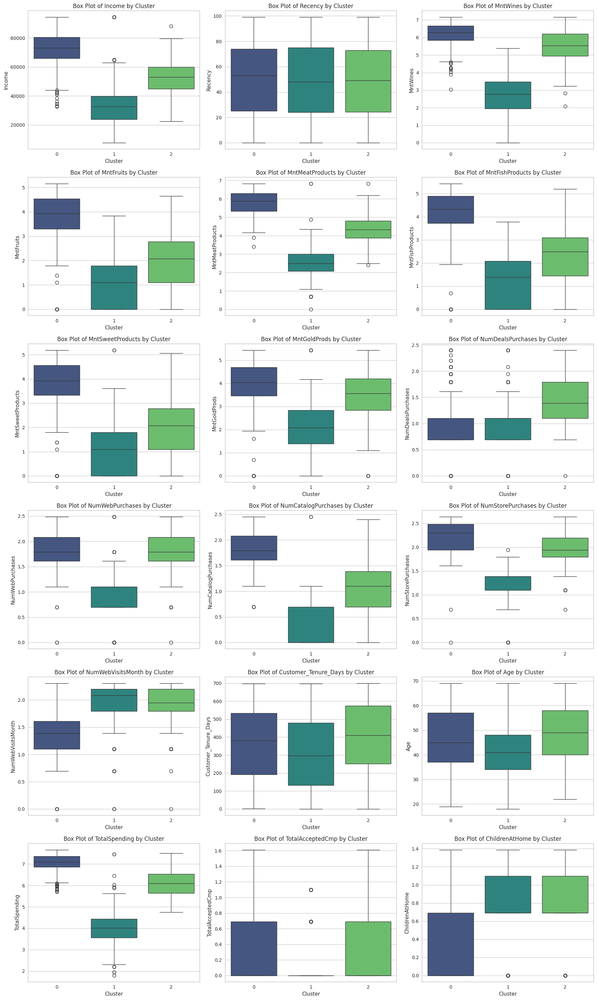

In [93]:
# Select the original numerical columns to profile (excluding IDs and Z_ features)
# Use original numerical features for easier interpretation of scale
numerical_cols_for_profiling = [
    'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'NumStorePurchases', 'NumWebVisitsMonth', 'Customer_Tenure_Days',
    'Age', 'TotalSpending', 'TotalAcceptedCmp', 'ChildrenAtHome' # Include children at home for profiling
]

# Ensure these columns are in the DataFrame
# This check is good practice during development but can be removed for the final notebook
# numerical_cols_profiling_present = [col for col in numerical_cols_for_profiling if col in df.columns]

# if not numerical_cols_profiling_present:
#     print("Warning: No numerical columns found for profiling.")
#     print("Please check the column names in df and the 'numerical_cols_for_profiling' list.")
# else:
print("Boxplots of Numerical Features by Cluster (K=3):")

# Determine the number of rows and columns for the subplot grid
n_cols = 3
n_rows = (len(numerical_cols_for_profiling) + n_cols - 1) // n_cols

# Create subplots with a slightly larger figure size for better visibility
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 5)) # Increased width
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Create a temporary DataFrame for plotting with capped numerical data and cluster labels
# Use the cluster labels from df, but the numerical data from df_capped
df_for_boxplot_profiling = df_capped[numerical_cols_for_profiling].copy()
df_for_boxplot_profiling['Cluster_k3'] = df['Cluster_k3']


# Create a boxplot for each numerical column, grouped by the cluster label (Cluster_k3)
# Use a distinct color palette for the clusters
for i, col in enumerate(numerical_cols_for_profiling):
    sns.boxplot(x='Cluster_k3', y=col, data=df_for_boxplot_profiling, ax=axes[i], palette='viridis') # Changed palette
    axes[i].set_title(f'Box Plot of {col} by Cluster')
    axes[i].set_xlabel('Cluster')
    axes[i].set_ylabel(col)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

##### **Observation on Cluster Profiling with Boxplots:**

Analyzing the boxplots of the numerical features across the three clusters (K=3) reveals distinct patterns:

*   **Income:** Cluster 0 generally has a higher median income and a wider spread compared to Clusters 1 and 2. Cluster 1 shows the lowest median income.
*   **Age:** The age distributions appear somewhat similar across the clusters, though there might be slight differences in median age or spread. Cluster 2 might have a slightly older median age.
*   **Recency:** Recency (days since last purchase) seems relatively similar across all three clusters, with overlapping box ranges, suggesting this feature is not a primary differentiator for these segments.
*   **Customer_Tenure_Days:** Cluster 0 and 2 appear to have slightly longer customer tenure on average compared to Cluster 1, though the distributions overlap.
*   **Spending (Mnt_ and TotalSpending):** This is where the clusters show the most significant differences.
    *   **Cluster 0** exhibits the highest median spending across **all** `Mnt_` categories (Wines, Fruits, Meat, Fish, Sweet, Gold) and the highest `TotalSpending`. The box ranges are also generally higher, indicating a segment of high-spending customers with diverse product purchases.
    *   **Cluster 1** shows the lowest median spending across all `Mnt_` categories and the lowest `TotalSpending`. Their box ranges are concentrated at lower values, representing a low-spending segment.
    *   **Cluster 2** falls in between Cluster 0 and 1 in terms of spending, with moderate median spending across most `Mnt_` categories and `TotalSpending`.
*   **Purchase Frequency (Num_):**
    *   **Cluster 0** shows higher median `NumCatalogPurchases` and `NumStorePurchases` compared to Clusters 1 and 2. `NumWebPurchases` might be moderate.
    *   **Cluster 1** has lower median purchase frequencies across most channels, particularly `NumCatalogPurchases` and `NumStorePurchases`. They might have higher `NumWebVisitsMonth`.
    *   **Cluster 2** shows moderate purchase frequencies, perhaps leaning towards `NumWebVisitsMonth` and `NumStorePurchases`.
*   **Campaign Responsiveness (TotalAcceptedCmp):** Cluster 0 has a higher median `TotalAcceptedCmp` compared to Clusters 1 and 2, indicating greater responsiveness to marketing campaigns. Cluster 1 and 2 have lower and similar median `TotalAcceptedCmp`.
*   **Children at Home (ChildrenAtHome):** Cluster 1 and 2 generally have a higher median `ChildrenAtHome` compared to Cluster 0, suggesting that the presence of children is a key differentiator, particularly for the lower and mid-spending segments.

In summary, the boxplots clearly show that the three clusters are primarily differentiated by **Income**, **Spending Level and Product Preferences**, **Purchase Channel Preference**, **Campaign Responsiveness**, and the **Presence of Children at Home**. Cluster 0 represents high-value, high-spending, highly engaged customers with fewer children. Cluster 1 represents low-spending, less engaged, family-focused customers. Cluster 2 represents mid-spending, moderately engaged, family-focused customers.

#### **Profiling Categorical and Binary Features with Bar Plots**

To complement the numerical profiling, we will now visualize the distribution of categorical and binary features across the three clusters using bar plots. This will help us understand how customer segments differ in terms of education, marital status, household composition (kids/teens at home), and campaign responsiveness.

Bar Plots of Categorical and Binary Features by Cluster (K=3):


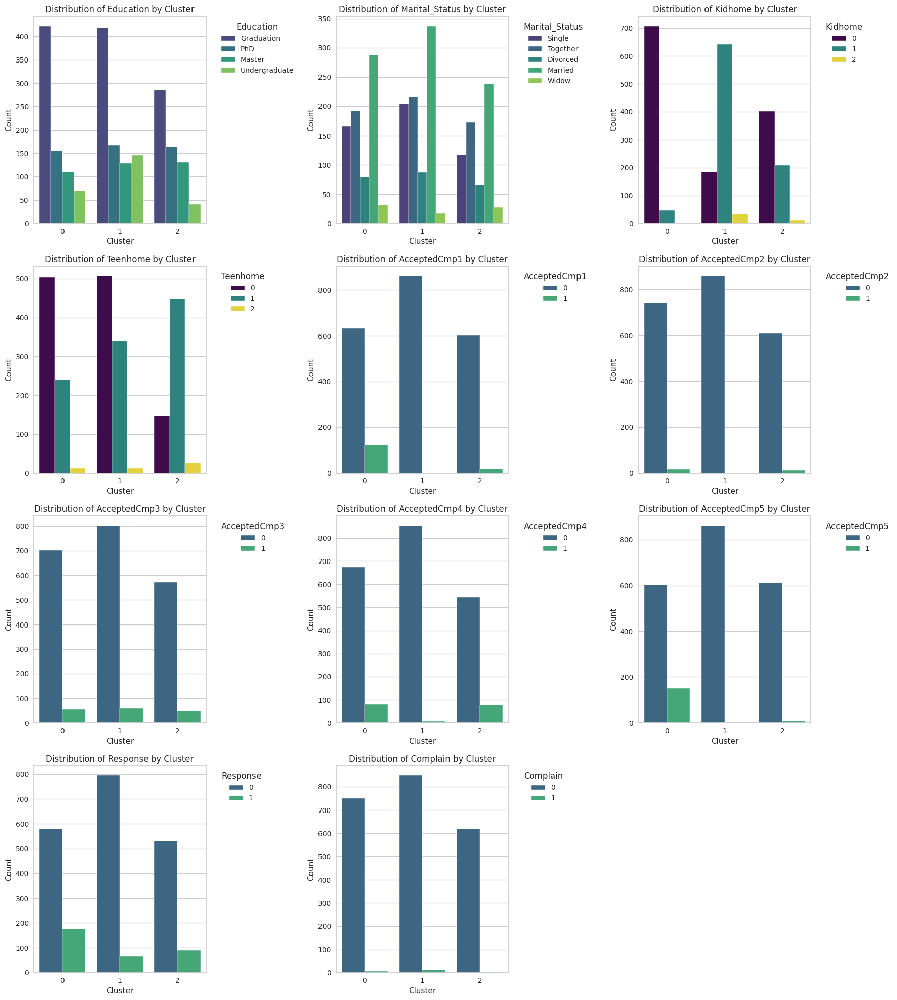

In [94]:
# Select categorical and binary columns for profiling
# Use original categorical columns for labels, and the one-hot encoded/binary flags
categorical_and_binary_cols = [
    'Education', 'Marital_Status', 'Kidhome', 'Teenhome',
    'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
    'Response', 'Complain'
]

# Ensure these columns are in the original DataFrame (df)
categorical_and_binary_cols_present = [col for col in categorical_and_binary_cols if col in df.columns]

if not categorical_and_binary_cols_present:
    print("Warning: No categorical or binary columns found for profiling.")
    print("Please check the column names in df and the 'categorical_and_binary_cols' list.")
else:
    print("Bar Plots of Categorical and Binary Features by Cluster (K=3):")

    # Determine the number of rows and columns for the subplot grid
    n_cols = 3
    n_rows = (len(categorical_and_binary_cols_present) + n_cols - 1) // n_cols

    # Create subplots with a slightly larger figure size
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 5))
    axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

    # Create a bar plot for each categorical/binary column, grouped by the cluster label (Cluster_k3)
    for i, col in enumerate(categorical_and_binary_cols_present):
        # Use countplot for original categorical features
        if col in ['Education', 'Marital_Status']:
            sns.countplot(x='Cluster_k3', hue=col, data=df, ax=axes[i], palette='viridis')
            axes[i].set_title(f'Distribution of {col} by Cluster')
            axes[i].set_xlabel('Cluster')
            axes[i].set_ylabel('Count')
            axes[i].legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside
        # Use countplot for binary/low cardinality numerical features (Kidhome, Teenhome, Campaign flags, Response, Complain)
        else:
            sns.countplot(x='Cluster_k3', hue=col, data=df, ax=axes[i], palette='viridis')
            axes[i].set_title(f'Distribution of {col} by Cluster')
            axes[i].set_xlabel('Cluster')
            axes[i].set_ylabel('Count')
            axes[i].legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left') # Move legend outside


    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

##### **Observation on Cluster Profiling with Bar Plots:**

Analyzing the bar plots of the categorical and binary features across the three clusters (K=3) provides further detail on the segment characteristics:

*   **Education:** While all clusters have a majority with 'Graduation', there are some differences in the proportions of higher education levels. Cluster 2 appears to have a slightly higher proportion of customers with 'Master' and 'PhD' degrees compared to the other two clusters.
*   **Marital Status:** The distribution of marital statuses appears relatively similar across all three clusters, with 'Married' and 'Together' being the most frequent in each. Marital status doesn't seem to be a primary differentiating factor for these three segments.
*   **Kidhome and Teenhome:** These features show clear differences.
    *   **Cluster 1** has a significantly higher proportion of customers with 1 or 2 kids at home (`Kidhome_1`, `Kidhome_2`) compared to Clusters 0 and 2.
    *   **Cluster 2** has a higher proportion of customers with 1 or 2 teens at home (`Teenhome_1`, `Teenhome_2`) compared to Clusters 0 and 1, and also a notable proportion with kids at home, though generally fewer kids than Cluster 1.
    *   **Cluster 0** has the lowest proportion of customers with either kids or teens at home, indicating this segment consists primarily of households without children living with them.
*   **Campaign Acceptance Flags (AcceptedCmp1-5 and Response):**
    *   **Cluster 0** shows higher counts (and thus higher proportions) of customers who accepted campaigns `AcceptedCmp1`, `AcceptedCmp4`, and `AcceptedCmp5`. They also have the highest number of customers who accepted the last campaign (`Response`). This aligns with the numerical observation that Cluster 0 has higher `TotalAcceptedCmp`.
    *   **Cluster 1** shows very low counts across all individual campaign acceptance flags and the `Response` flag, consistent with their low `TotalAcceptedCmp`.
    *   **Cluster 2** shows moderate counts for some campaign flags (e.g., `AcceptedCmp4`) and `Response`, falling between Cluster 0 and Cluster 1 in terms of campaign responsiveness.
*   **Complain:** The 'Complain' flag shows very low counts across all clusters, confirming its low variance and limited utility for differentiation, as noted in the EDA.

In summary, the bar plots reinforce the numerical profiling, clearly showing that the presence of **children at home (kids and teens)** and **campaign responsiveness** are key factors differentiating the clusters, alongside the numerical differences in income and spending. Education shows some subtle differences, while marital status appears less discriminatory for these three segments.

### **Visualizing Customer Clusters (K=3)**

To visually assess the separation and structure of the three customer clusters identified by K-Means, we can reduce the dimensionality of our `df_selected_for_clustering` data and plot the data points in a 2D space, colored by their assigned cluster labels.

Principal Component Analysis (PCA) is a common technique for dimensionality reduction that projects the data onto a lower-dimensional space while retaining as much of the original variance as possible. We will use PCA to reduce our feature set to 2 components for visualization.

Explained variance ratio by the first two principal components: 0.5396648238694169

First 5 rows of the PCA DataFrame with cluster labels:


,principal_component_1,principal_component_2,Cluster_k3
0,3.478024,1.893600,0
1,-3.203479,-1.720989,1
2,2.318118,-0.279826,0
3,-2.832759,-0.092563,1
4,1.033015,-0.208854,2


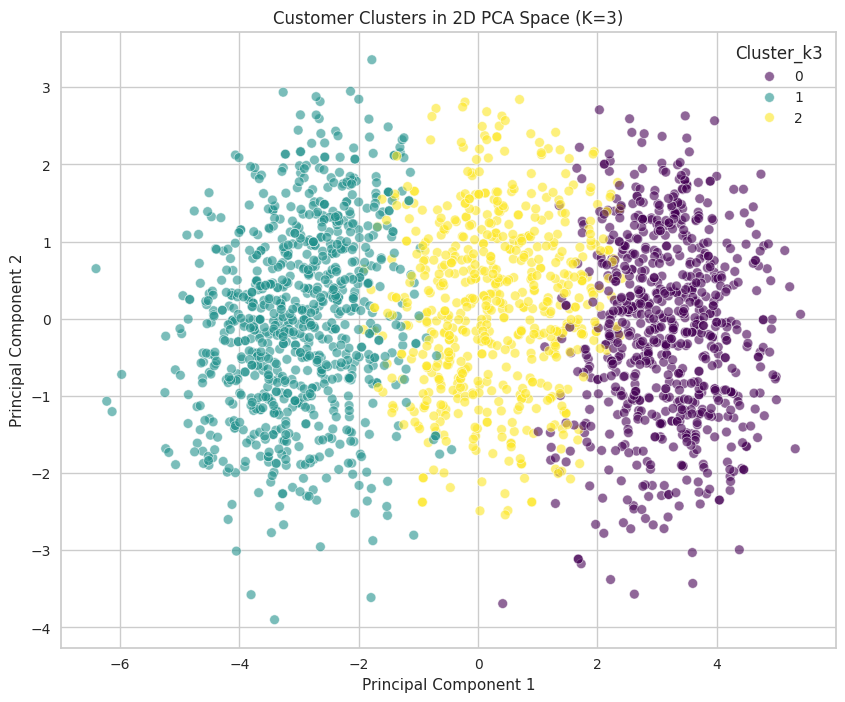

In [95]:
from sklearn.decomposition import PCA

# Initialize PCA to reduce to 2 components
pca = PCA(n_components=2)

# Fit and transform the selected data for clustering
principal_components = pca.fit_transform(df_selected_for_clustering)

# Create a DataFrame with the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['principal_component_1', 'principal_component_2'])

# Add the cluster labels to the PCA DataFrame
# Ensure index alignment with the original df and df_selected_for_clustering
pca_df['Cluster_k3'] = df['Cluster_k3']


print("Explained variance ratio by the first two principal components:", pca.explained_variance_ratio_.sum())
print("\nFirst 5 rows of the PCA DataFrame with cluster labels:")
display(pca_df.head())

# Plot the clusters in the 2D PCA space
plt.figure(figsize=(10, 8))
sns.scatterplot(x='principal_component_1', y='principal_component_2', hue='Cluster_k3', data=pca_df, palette='viridis', legend='full', alpha=0.6)
plt.title('Customer Clusters in 2D PCA Space (K=3)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

##### **Observation on Visualizing Customer Clusters (PCA):**

The scatter plot visualizes the three customer clusters in the 2D space defined by the first two principal components. These two components together explain approximately **54%** of the total variance in our selected features.

Looking at the plot:

*   The clusters appear reasonably distinct, although there is some degree of overlap between them.
*   **Cluster 1** (teal) seems to be relatively well-separated from the other two clusters, particularly from Cluster 0.
*   **Cluster 0** (purple) and **Cluster 2** (yellow) show some overlap, especially in the central region of the plot.

The visualization suggests that while the clusters are not perfectly separated in this 2D projection, there are discernible groupings based on the features used for clustering. The first two principal components capture a significant portion of the data's variance, providing a reasonable projection for visual assessment. This visual separation, combined with the distinct characteristics identified in the cluster profiling (boxplots and bar plots), supports the validity of the three-cluster segmentation.

## **Business Recommendations**

Based on the K-Means clustering analysis, we have successfully segmented the customer base into three distinct groups. The goal of this segmentation was to move beyond a one-size-fits-all marketing approach and understand the diverse characteristics, behaviors, and needs of different customer segments. By tailoring marketing strategies to the specific profiles of these clusters, the business can improve customer engagement, optimize marketing spend, and ultimately drive revenue growth.

Here are actionable business recommendations based on the insights gained from analyzing the three customer segments:

### **Segment 0: High-Income, High-Spending, Engaged Customers**

*   **Profile:** This segment consists of customers with **high average income and high overall spending** across various product categories, particularly **Wines, Meat, and Gold Products**. They are highly engaged across various channels (especially catalog and store) and are very responsive to marketing campaigns. They tend to have fewer children at home. Their marital status distribution is similar to the overall customer base, and their education distribution is generally similar to Segment 1 and the overall customer base, with a majority in Graduation.
*   **Recommendations:**
    *   **Retention and Loyalty Programs:** Focus on retaining these valuable customers with exclusive loyalty programs, premium offers, and personalized communications.
    *   **Upselling and Cross-selling:** Given their high spending across various product categories, target them with recommendations for **premium wines, high-quality meat products, and exclusive gold items**, as well as related complementary products.
    *   **VIP Treatment:** Consider offering VIP experiences, early access to sales, or special events to reinforce their value to the business.
    *   **Preferred Channels:** Continue engaging them through their preferred channels, particularly **catalog and in-store experiences**, leveraging their high engagement here. Also, utilize targeted digital marketing given their overall engagement.
    *   **Leverage Campaign Responsiveness:** Capitalize on their high campaign acceptance rates with targeted and personalized campaign messages and offers, emphasizing exclusivity and premium value.

### **Segment 1: Lower-Income, Low-Spending, Family-Focused Customers**

*   **Profile:** This segment is characterized by **substantially lower average income and very low spending** across all product categories. They have lower purchase frequencies (though higher web visits), low campaign acceptance rates, and a high presence of young children at home. Their marital status distribution is similar to the overall customer base, and their education distribution is generally similar to Segment 0 and the overall customer base, with a majority in Graduation.
*   **Recommendations:**
    *   **Value-Oriented Offers:** Focus on value propositions, **discounts, essential product bundles (e.g., family packs, bulk buys)**, and products relevant to families with young children and potentially tighter budgets (e.g., basics, staples).
    *   **Cost-Effective Channels:** Utilize **cost-effective digital channels (email, social media, targeted web ads)** and leverage their higher web visits to reach this segment with relevant offers. In-store promotions can also be effective.
    *   **Family-Centric Messaging:** Tailor marketing messages to resonate with the needs and challenges of families with young children. Highlight convenience, value, and products suitable for kids.
    *   **Consider Lifecycle Marketing:** As children grow, the needs and spending potential of this segment may change. Implement lifecycle marketing to adapt strategies as their household composition evolves.
    *   **Explore Partnership Opportunities:** Partner with brands or services relevant to young families (e.g., toy stores, family entertainment venues).

### **Segment 2: Mid-Income, Mid-Spending, Family-Focused Customers (with Teens)**

*   **Profile:** This segment falls between the other two in terms of **moderate income and moderate spending**. They have moderate engagement across channels, moderate campaign acceptance, and a notable presence of teenagers at home, often along with younger children. Their marital status distribution is similar to the overall customer base, but this segment shows a slightly higher proportion of customers with Master and PhD degrees compared to the other two segments.
*   **Recommendations:**
    *   **Balanced Offers:** Offer a mix of value and mid-range products. Their spending indicates they are willing to spend more than Segment 1 but may not be in the high-end category of Segment 0. Promote products that appeal to households with teenagers and potentially younger children, considering categories like **electronics, snacks, beverages, or products related to teenage interests (e.g., beauty, gaming)**.
    *   **Multi-Channel Engagement:** Engage them across **web and store channels**, leveraging their moderate web visits and store purchase frequency. Targeted email and social media campaigns can also be effective.
    *   **Moderate Campaign Engagement:** Use targeted campaigns with clear value propositions to improve their campaign acceptance rates. Consider offering incentives relevant to families with teens.
    *   **Understand Teen Influence:** Explore how teenage presence influences purchasing decisions and tailor messaging accordingly, potentially involving teens in marketing or product features.

### **Overall Recommendations and Implementation:**

*   **Personalization:** Leverage the cluster profiles to personalize marketing messages, product recommendations, and offers for each segment across all touchpoints.
*   **Channel Optimization:** Allocate marketing budget and resources strategically to the channels most effective for reaching and engaging each specific segment.
*   **Customer Lifecycle:** Recognize that customers may move between segments over time due to changes in income, household composition, or life stage. Continuously monitor segment membership and adapt strategies dynamically.
*   **A/B Testing:** Implement A/B testing for different marketing campaigns, messaging, and offers within each segment to optimize performance and identify what resonates best.
*   **Implementation:** Integrate the customer segmentation into the CRM system to enable targeted marketing campaigns, personalized communications, and tailored customer experiences based on segment membership.
*   **Monitoring and Refinement:** Continuously monitor the size and characteristics of each segment, track the performance of targeted campaigns, and refine the segmentation or strategies as needed based on new data and insights.
*   **Further Analysis:** Consider further analysis within segments, such as product affinity analysis or market basket analysis, to identify cross-selling opportunities and refine targeting even more.

By implementing these tailored recommendations, the business can effectively engage with its diverse customer base, meet their specific needs, and build stronger, more profitable relationships, ultimately driving revenue growth and improving customer lifetime value.